In [ ]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as gos
import plotly.figure_factory as ff
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [ ]:
df = pd.read_csv("cardekho_updated.csv.zip")

In [ ]:
df

,full_name,selling_price,new_price,year,seller_type,km_driven,owner_type,fuel_type,transmission_type,mileage,engine,max_power,seats
0,Maruti Alto Std,1.2 Lakh*,NaN,2012,Individual,"1,20,000 kms",First Owner,Petrol,Manual,Mileage19.7 kmpl,Engine796 CC,Max Power46.3 bhp,Seats5
1,Hyundai Grand i10 Asta,5.5 Lakh*,New Car (On-Road Price) : Rs.7.11-7.48 Lakh*,2016,Individual,"20,000 kms",First Owner,Petrol,Manual,Mileage18.9 kmpl,Engine1197 CC,Max Power82 bhp,Seats5
2,Hyundai i20 Asta,2.15 Lakh*,NaN,2010,Individual,"60,000 kms",First Owner,Petrol,Manual,Mileage17.0 kmpl,Engine1197 CC,Max Power80 bhp,Seats5
3,Maruti Alto K10 2010-2014 VXI,2.26 Lakh*,NaN,2012,Individual,"37,000 kms",First Owner,Petrol,Manual,Mileage20.92 kmpl,Engine998 CC,Max Power67.1 bhp,Seats5
4,Ford Ecosport 2015-2021 1.5 TDCi Titanium BSIV,5.7 Lakh*,New Car (On-Road Price) : Rs.10.14-13.79 Lakh*,2015,Dealer,"30,000 kms",First Owner,Diesel,Manual,Mileage22.77 kmpl,Engine1498 CC,Max Power98.59 bhp,Seats5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
19969,Toyota Platinum Etios 1.4 GXD,6.5 Lakh*,NaN,2017,Dealer,"69,480 kms",First Owner,Diesel,Manual,Mileage23.59 kmpl,Engine1364 CC,Max Power67.05 bhp,Seats5
19970,Maruti Ertiga BSIV VXI,9.25 Lakh*,NaN,2019,Dealer,"18,000 kms",First Owner,Petrol,Manual,Mileage17.5 kmpl,Engine1373 CC,Max Power91.1 bhp,Seats7
19971,Skoda Rapid 1.5 TDI Elegance,4.25 Lakh*,NaN,2015,Dealer,"67,000 kms",First Owner,Diesel,Manual,Mileage21.14 kmpl,Engine1498 CC,Max Power103.52 bhp,Seats5
19972,Mahindra XUV500 W6 2WD,12.25 Lakh*,New Car (On-Road Price) : Rs.17.83-24.91 Lakh*,2016,Dealer,"38,00,000 kms",First Owner,Diesel,Manual,Mileage16.0 kmpl,Engine2179 CC,Max Power140 bhp,Seats7


In [ ]:
df.sample(random_state=30,n=5)

,full_name,selling_price,new_price,year,seller_type,km_driven,owner_type,fuel_type,transmission_type,mileage,engine,max_power,seats
10742,Tata Indigo eGLS BS IV,1.4 Lakh*,NaN,2013,Dealer,"71,000 kms",First Owner,Petrol,Manual,Mileage15.64 kmpl,Engine1193 CC,Max Power64.1 bhp,Seats5
1465,Toyota Fortuner 4x2 Manual,14.75 Lakh*,New Car (On-Road Price) : Rs.39.97-46.24 Lakh*,2015,Dealer,"96,000 kms",First Owner,Diesel,Manual,Mileage13.0 kmpl,Engine2982 CC,Max Power168.5 bhp,Seats7
14136,Ford Ecosport 2015-2021 1.5 Ti VCT AT Titanium...,6.8 Lakh*,NaN,2016,Dealer,"53,000 kms",First Owner,Petrol,Automatic,Mileage16.05 kmpl,Engine1499 CC,Max Power110.4 bhp,Seats5
2954,Tata Bolt Revotron XT,3.55 Lakh*,NaN,2015,Dealer,"68,000 kms",First Owner,Petrol,Manual,Mileage17.57 kmpl,Engine1193 CC,Max Power88.7 bhp,Seats5
17443,Maruti Swift Dzire VDI,4.75 Lakh*,NaN,2013,Individual,"90,000 kms",First Owner,Diesel,Manual,Mileage23.4 kmpl,Engine1248 CC,Max Power74 bhp,Seats5


In [ ]:
df.shape

(19974, 13)

In [ ]:
df.ndim
# 2D dataset

2

In [ ]:
df.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19974 entries, 0 to 19973
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   full_name          19974 non-null  object
 1   selling_price      19974 non-null  object
 2   new_price          9564 non-null   object
 3   year               19974 non-null  int64 
 4   seller_type        19974 non-null  object
 5   km_driven          19974 non-null  object
 6   owner_type         19974 non-null  object
 7   fuel_type          19974 non-null  object
 8   transmission_type  19974 non-null  object
 9   mileage            19814 non-null  object
 10  engine             19864 non-null  object
 11  max_power          19637 non-null  object
 12  seats              19887 non-null  object
dtypes: int64(1), object(12)
memory usage: 15.8 MB


## Data Cleaning

In [ ]:
# Checking for Null values
df.isna().sum()

full_name                0
selling_price            0
new_price            10410
year                     0
seller_type              0
km_driven                0
owner_type               0
fuel_type                0
transmission_type        0
mileage                160
engine                 110
max_power              337
seats                   87
dtype: int64

In [ ]:
df.columns

Index(['full_name', 'selling_price', 'new_price', 'year', 'seller_type',
       'km_driven', 'owner_type', 'fuel_type', 'transmission_type', 'mileage',
       'engine', 'max_power', 'seats'],
      dtype='object')

In [ ]:
df.dropna(axis='rows',subset=['full_name', 'selling_price', 'year', 'seller_type',
       'km_driven', 'owner_type', 'fuel_type', 'transmission_type', 'mileage',
       'engine', 'max_power', 'seats'],how='any',inplace=True)
# default how=any, inplace = False

In [ ]:
df.shape
# The dataset has 19542 rows and 13 columns

(19542, 13)

In [ ]:
df.sample(random_state=30,n=5)

,full_name,selling_price,new_price,year,seller_type,km_driven,owner_type,fuel_type,transmission_type,mileage,engine,max_power,seats
299,Maruti Zen Estilo VXI BSIII,1.65 Lakh*,NaN,2010,Dealer,"62,821 kms",First Owner,Petrol,Manual,Mileage18.2 kmpl,Engine998 CC,Max Power67.1 bhp,Seats5
2476,Maruti Ciaz VXi,6.55 Lakh*,NaN,2017,Dealer,"27,400 kms",First Owner,Petrol,Manual,Mileage20.73 kmpl,Engine1373 CC,Max Power91.1 bhp,Seats5
11771,Hyundai Grand i10 AT Asta,4.75 Lakh*,New Car (On-Road Price) : Rs.7.01-7.37 Lakh*,2015,Dealer,"69,000 kms",First Owner,Petrol,Automatic,Mileage18.9 kmpl,Engine1197 CC,Max Power82 bhp,Seats5
17672,Hyundai i10 Sportz 1.2 AT,2.25 Lakh*,New Car (On-Road Price) : Rs.7.06-7.42 Lakh*,2009,Dealer,"70,000 kms",First Owner,Petrol,Automatic,Mileage16.95 kmpl,Engine1197 CC,Max Power78.9 bhp,Seats5
3480,Mercedes-Benz E-Class E 250 Elegance,10 Lakh*,New Car (On-Road Price) : Rs.74.17-1.72 Cr*,2010,Individual,"70,000 kms",First Owner,Petrol,Automatic,Mileage10.93 kmpl,Engine2497 CC,Max Power204 bhp,Seats5


**Creating an age value from the year**

In [ ]:
current_year = 2021
df['vehicle_age'] = current_year-df.year
df.drop(['year'],axis='columns',inplace=True)

df.sample(random_state=30,n=5)

,full_name,selling_price,new_price,seller_type,km_driven,owner_type,fuel_type,transmission_type,mileage,engine,max_power,seats,vehicle_age
299,Maruti Zen Estilo VXI BSIII,1.65 Lakh*,NaN,Dealer,"62,821 kms",First Owner,Petrol,Manual,Mileage18.2 kmpl,Engine998 CC,Max Power67.1 bhp,Seats5,11
2476,Maruti Ciaz VXi,6.55 Lakh*,NaN,Dealer,"27,400 kms",First Owner,Petrol,Manual,Mileage20.73 kmpl,Engine1373 CC,Max Power91.1 bhp,Seats5,4
11771,Hyundai Grand i10 AT Asta,4.75 Lakh*,New Car (On-Road Price) : Rs.7.01-7.37 Lakh*,Dealer,"69,000 kms",First Owner,Petrol,Automatic,Mileage18.9 kmpl,Engine1197 CC,Max Power82 bhp,Seats5,6
17672,Hyundai i10 Sportz 1.2 AT,2.25 Lakh*,New Car (On-Road Price) : Rs.7.06-7.42 Lakh*,Dealer,"70,000 kms",First Owner,Petrol,Automatic,Mileage16.95 kmpl,Engine1197 CC,Max Power78.9 bhp,Seats5,12
3480,Mercedes-Benz E-Class E 250 Elegance,10 Lakh*,New Car (On-Road Price) : Rs.74.17-1.72 Cr*,Individual,"70,000 kms",First Owner,Petrol,Automatic,Mileage10.93 kmpl,Engine2497 CC,Max Power204 bhp,Seats5,11


**Creating column "brand" & "model" from "full_name**

In [ ]:
df.full_name.sample(n=5,random_state=30)

299               Maruti Zen Estilo VXI BSIII
2476                          Maruti Ciaz VXi
11771               Hyundai Grand i10 AT Asta
17672               Hyundai i10 Sportz 1.2 AT
3480     Mercedes-Benz E-Class E 250 Elegance
Name: full_name, dtype: object

In [ ]:
# Total number of unique vehicles
df.full_name.nunique()

3197

In [ ]:
# Total number of vehicles
df.full_name.value_counts().sum()

19542

In [ ]:
# https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.replace.html?highlight=replace#pandas.DataFrame.replace
# https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.Series.str.replace.html?highlight=replace#pandas.Series.str.replace
# https://docs.python.org/3/library/stdtypes.html#str.replace
df['full_name'] = df["full_name"].str.replace(" New", " ")

In [ ]:
df.full_name.sample(n=5,random_state=30)

299               Maruti Zen Estilo VXI BSIII
2476                          Maruti Ciaz VXi
11771               Hyundai Grand i10 AT Asta
17672               Hyundai i10 Sportz 1.2 AT
3480     Mercedes-Benz E-Class E 250 Elegance
Name: full_name, dtype: object

In [ ]:
# a = "hello gegete"
# a.split(' ')
# # Output
# # ['hello', 'gegete']

In [ ]:
# https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.Series.str.split.html?highlight=split
# https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.Series.str.split.html?highlight=split#pandas.Series.str.split
# https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.Series.str.get.html?highlight=str%20get#pandas.Series.str.get

# Obtaining the brand value
df["brand"] = df.full_name.str.split(' ').str.get(0)

Example

In [ ]:
df.loc[:,['brand','full_name']]

,brand,full_name
0,Maruti,Maruti Alto Std
1,Hyundai,Hyundai Grand i10 Asta
2,Hyundai,Hyundai i20 Asta
3,Maruti,Maruti Alto K10 2010-2014 VXI
4,Ford,Ford Ecosport 2015-2021 1.5 TDCi Titanium BSIV
...,...,...
19969,Toyota,Toyota Platinum Etios 1.4 GXD
19970,Maruti,Maruti Ertiga BSIV VXI
19971,Skoda,Skoda Rapid 1.5 TDI Elegance
19972,Mahindra,Mahindra XUV500 W6 2WD


In [ ]:
df.iloc[[0,4,5],[0,4]]

,full_name,km_driven
0,Maruti Alto Std,"1,20,000 kms"
4,Ford Ecosport 2015-2021 1.5 TDCi Titanium BSIV,"30,000 kms"
5,Maruti Wagon R VXI BS IV,"35,000 kms"


In [ ]:
df.iloc[0,4]

'1,20,000 kms'

End of example

In [ ]:
df.loc[(df.brand == 'Land'),'brand']='Land Rover'

# replacing all values in the brand column that has the value "Land" with "Land Rover"

In [ ]:
df.brand.head(2)

0     Maruti
1    Hyundai
Name: brand, dtype: object

Example

In [ ]:
a = "hello gegete hegee hfhfhfh"
a.split(' ')
# 3 the stopping index is not included
" ".join(a.split(' ')[0:3]) # Output --> 'hello gegete hegee'
# " ".join(a[1:3].split(' ')) # Output --> 'el'

'hello gegete hegee'

End of Example

In [ ]:
# Creating the model 
df["model"] = df["full_name"].apply(lambda x: "".join(x.split(' ')[1:3]) if "Dzire" in x else ''.join(x.split(' ')[1]))

In [ ]:
df.loc[:5,["full_name",'brand',"model"]]

,full_name,brand,model
0,Maruti Alto Std,Maruti,Alto
1,Hyundai Grand i10 Asta,Hyundai,Grand
2,Hyundai i20 Asta,Hyundai,i20
3,Maruti Alto K10 2010-2014 VXI,Maruti,Alto
4,Ford Ecosport 2015-2021 1.5 TDCi Titanium BSIV,Ford,Ecosport
5,Maruti Wagon R VXI BS IV,Maruti,Wagon


In [ ]:
# Renaming car models 

df.loc[(df.model == "Wagon"),'model'] = "Wagon R"
df.loc[(df.model == "E"),'model'] = 'E Verito'
df.loc[(df.model == "Land"),'model'] = 'Land Cruiser'

In [ ]:
df.loc[:5,["full_name",'brand',"model"]]

,full_name,brand,model
0,Maruti Alto Std,Maruti,Alto
1,Hyundai Grand i10 Asta,Hyundai,Grand
2,Hyundai i20 Asta,Hyundai,i20
3,Maruti Alto K10 2010-2014 VXI,Maruti,Alto
4,Ford Ecosport 2015-2021 1.5 TDCi Titanium BSIV,Ford,Ecosport
5,Maruti Wagon R VXI BS IV,Maruti,Wagon R


In [ ]:
# Dropping full_name
df.drop('full_name',axis=1,inplace=True)

# or 
# df.drop(columns=['full_name'])

# or
# df.drop(['B', 'C'], axis=1)

In [ ]:
# Creating car_name column

df["car_name"] = df['brand'] + " "+df['model']
df_unique = pd.DataFrame(df['car_name'].value_counts())
df.loc[:,['brand','model','car_name']].sample(n=5,random_state=30)

,brand,model,car_name
299,Maruti,Zen,Maruti Zen
2476,Maruti,Ciaz,Maruti Ciaz
11771,Hyundai,Grand,Hyundai Grand
17672,Hyundai,i10,Hyundai i10
3480,Mercedes-Benz,E-Class,Mercedes-Benz E-Class


**Converting "new_price" into "min_price" & "max_price**

In [ ]:
df_unique

,car_name
Hyundai i20,906
Maruti SwiftDzire,890
Maruti Swift,781
Maruti Alto,778
Honda City,756
...,...
Isuzu MUX,1
Rolls-Royce Ghost,1
Jaguar F-TYPE,1
Maserati Quattroporte,1


In [ ]:
df

,selling_price,new_price,seller_type,km_driven,owner_type,fuel_type,transmission_type,mileage,engine,max_power,seats,vehicle_age,brand,model,car_name
0,1.2 Lakh*,NaN,Individual,"1,20,000 kms",First Owner,Petrol,Manual,Mileage19.7 kmpl,Engine796 CC,Max Power46.3 bhp,Seats5,9,Maruti,Alto,Maruti Alto
1,5.5 Lakh*,New Car (On-Road Price) : Rs.7.11-7.48 Lakh*,Individual,"20,000 kms",First Owner,Petrol,Manual,Mileage18.9 kmpl,Engine1197 CC,Max Power82 bhp,Seats5,5,Hyundai,Grand,Hyundai Grand
2,2.15 Lakh*,NaN,Individual,"60,000 kms",First Owner,Petrol,Manual,Mileage17.0 kmpl,Engine1197 CC,Max Power80 bhp,Seats5,11,Hyundai,i20,Hyundai i20
3,2.26 Lakh*,NaN,Individual,"37,000 kms",First Owner,Petrol,Manual,Mileage20.92 kmpl,Engine998 CC,Max Power67.1 bhp,Seats5,9,Maruti,Alto,Maruti Alto
4,5.7 Lakh*,New Car (On-Road Price) : Rs.10.14-13.79 Lakh*,Dealer,"30,000 kms",First Owner,Diesel,Manual,Mileage22.77 kmpl,Engine1498 CC,Max Power98.59 bhp,Seats5,6,Ford,Ecosport,Ford Ecosport
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19969,6.5 Lakh*,NaN,Dealer,"69,480 kms",First Owner,Diesel,Manual,Mileage23.59 kmpl,Engine1364 CC,Max Power67.05 bhp,Seats5,4,Toyota,Platinum,Toyota Platinum
19970,9.25 Lakh*,NaN,Dealer,"18,000 kms",First Owner,Petrol,Manual,Mileage17.5 kmpl,Engine1373 CC,Max Power91.1 bhp,Seats7,2,Maruti,Ertiga,Maruti Ertiga
19971,4.25 Lakh*,NaN,Dealer,"67,000 kms",First Owner,Diesel,Manual,Mileage21.14 kmpl,Engine1498 CC,Max Power103.52 bhp,Seats5,6,Skoda,Rapid,Skoda Rapid
19972,12.25 Lakh*,New Car (On-Road Price) : Rs.17.83-24.91 Lakh*,Dealer,"38,00,000 kms",First Owner,Diesel,Manual,Mileage16.0 kmpl,Engine2179 CC,Max Power140 bhp,Seats7,5,Mahindra,XUV500,Mahindra XUV500


In [ ]:
# https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.Series.str.lstrip.html?highlight=lstrip#pandas.Series.str.lstrip
df["new_price1"] = df['new_price'].str.lstrip('New Car (On-Road Price) : Rs.')

df.new_price1 = df.new_price1.str.replace('[*,,]', '')
df[['new_price1','unit']] = df.new_price1.str.split(' ',expand=True)
df[['min_cost_price','max_cost_price']] = df.new_price1.str.split("-",expand=True)

df.min_cost_price = df.min_cost_price.str.replace('[A-Za-z]', '')
df.max_cost_price = df.max_cost_price.str.replace('[A-Za-z]', '')
df[['new_price1','unit','min_cost_price','max_cost_price']]

,new_price1,unit,min_cost_price,max_cost_price
0,NaN,NaN,NaN,NaN
1,7.11-7.48,Lakh,7.11,7.48
2,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN
4,10.14-13.79,Lakh,10.14,13.79
...,...,...,...,...
19969,NaN,NaN,NaN,NaN
19970,NaN,NaN,NaN,NaN
19971,NaN,NaN,NaN,NaN
19972,17.83-24.91,Lakh,17.83,24.91


In [ ]:
df.drop(['new_price','new_price1'],axis=1,inplace=True)
df.head()

,selling_price,seller_type,km_driven,owner_type,fuel_type,transmission_type,mileage,engine,max_power,seats,vehicle_age,brand,model,car_name,unit,min_cost_price,max_cost_price
0,1.2 Lakh*,Individual,"1,20,000 kms",First Owner,Petrol,Manual,Mileage19.7 kmpl,Engine796 CC,Max Power46.3 bhp,Seats5,9,Maruti,Alto,Maruti Alto,NaN,NaN,NaN
1,5.5 Lakh*,Individual,"20,000 kms",First Owner,Petrol,Manual,Mileage18.9 kmpl,Engine1197 CC,Max Power82 bhp,Seats5,5,Hyundai,Grand,Hyundai Grand,Lakh,7.11,7.48
2,2.15 Lakh*,Individual,"60,000 kms",First Owner,Petrol,Manual,Mileage17.0 kmpl,Engine1197 CC,Max Power80 bhp,Seats5,11,Hyundai,i20,Hyundai i20,NaN,NaN,NaN
3,2.26 Lakh*,Individual,"37,000 kms",First Owner,Petrol,Manual,Mileage20.92 kmpl,Engine998 CC,Max Power67.1 bhp,Seats5,9,Maruti,Alto,Maruti Alto,NaN,NaN,NaN
4,5.7 Lakh*,Dealer,"30,000 kms",First Owner,Diesel,Manual,Mileage22.77 kmpl,Engine1498 CC,Max Power98.59 bhp,Seats5,6,Ford,Ecosport,Ford Ecosport,Lakh,10.14,13.79


In [ ]:
df.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19542 entries, 0 to 19973
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   selling_price      19542 non-null  object
 1   seller_type        19542 non-null  object
 2   km_driven          19542 non-null  object
 3   owner_type         19542 non-null  object
 4   fuel_type          19542 non-null  object
 5   transmission_type  19542 non-null  object
 6   mileage            19542 non-null  object
 7   engine             19542 non-null  object
 8   max_power          19542 non-null  object
 9   seats              19542 non-null  object
 10  vehicle_age        19542 non-null  int64 
 11  brand              19542 non-null  object
 12  model              19542 non-null  object
 13  car_name           19542 non-null  object
 14  unit               9441 non-null   object
 15  min_cost_price     9441 non-null   object
 16  max_cost_price     9160 non-null   objec

In [ ]:
# Converting data type to float
df.max_cost_price = df.max_cost_price.astype('float64')
df.min_cost_price = df.min_cost_price.astype('float64')

**Converting cost price to appropriate units**

In [ ]:
# Converting cost price to appropriate units
# 1 Lakh = 100000 units
df.loc[df.unit == "Lakh", 'min_cost_price'] = df.min_cost_price * 100000.0
df.loc[df.unit == "Lakh", 'max_cost_price'] = df.max_cost_price * 100000.0

# 1 Cr = 10000000.0 units
df.loc[df.unit == "Cr", 'min_cost_price'] = df.min_cost_price * 10000000.0
df.loc[df.unit == "Cr", 'max_cost_price'] = df.max_cost_price * 10000000.0


In [ ]:
df.isna().sum()

selling_price            0
seller_type              0
km_driven                0
owner_type               0
fuel_type                0
transmission_type        0
mileage                  0
engine                   0
max_power                0
seats                    0
vehicle_age              0
brand                    0
model                    0
car_name                 0
unit                 10101
min_cost_price       10101
max_cost_price       10382
dtype: int64

In [ ]:
df.drop(['unit'],axis='columns', inplace=True)

In [ ]:
# Filling cars whose "max_cost_price" is missing with "min_cost_price"
df.max_cost_price = df.max_cost_price.fillna(df.min_cost_price)
same_as_max_cost = df.max_cost_price == df.min_cost_price

In [ ]:
df[same_as_max_cost]

,selling_price,seller_type,km_driven,owner_type,fuel_type,transmission_type,mileage,engine,max_power,seats,vehicle_age,brand,model,car_name,min_cost_price,max_cost_price
296,14 Lakh*,Individual,"30,000 kms",First Owner,Diesel,Manual,Mileage17.6 kmpl,Engine2179 CC,Max Power153.86 bhp,Seats7,3,Tata,Hexa,Tata Hexa,1410000.0,1410000.0
377,20 Lakh*,Dealer,"98,000 kms",First Owner,Diesel,Automatic,Mileage12.07 kmpl,Engine2967 CC,Max Power241.4 bhp,Seats7,9,Audi,Q7,Audi Q7,8060000.0,8060000.0
422,55 Lakh*,Individual,"30,000 kms",First Owner,Petrol,Automatic,Mileage14.28 kmpl,Engine1998 CC,Max Power254.7 bhp,Seats4,3,BMW,6,BMW 6,7837000.0,7837000.0
567,3.6 Lakh*,Dealer,"34,500 kms",First Owner,CNG,Manual,Mileage21.94 km/kg,Engine1196 CC,Max Power61.7 bhp,Seats5,3,Maruti,Eeco,Maruti Eeco,574000.0,574000.0
611,14 Lakh*,Individual,"60,000 kms",First Owner,Diesel,Manual,Mileage17.6 kmpl,Engine2179 CC,Max Power153.86 bhp,Seats7,3,Tata,Hexa,Tata Hexa,1410000.0,1410000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19381,33.5 Lakh*,Dealer,"48,000 kms",First Owner,Diesel,Automatic,Mileage16.46 kmpl,Engine2993 CC,Max Power258 bhp,Seats5,7,BMW,7,BMW 7,16700000.0,16700000.0
19395,22.5 Lakh*,Dealer,"63,000 kms",First Owner,Diesel,Automatic,Mileage14.49 kmpl,Engine2993 CC,Max Power258 bhp,Seats5,8,BMW,7,BMW 7,16700000.0,16700000.0
19662,37.5 Lakh*,Individual,"40,000 kms",First Owner,Diesel,Automatic,Mileage18.56 kmpl,Engine1995 CC,Max Power190 bhp,Seats5,4,BMW,X3,BMW X3,7378000.0,7378000.0
19671,9.5 Lakh*,Dealer,"7,400 kms",First Owner,CNG,Manual,Mileage26.08 km/kg,Engine1462 CC,Max Power91.19 bhp,Seats7,1,Maruti,Ertiga,Maruti Ertiga,1022000.0,1022000.0


In [ ]:
df.loc[[377,296],['max_cost_price','min_cost_price']]

,max_cost_price,min_cost_price
377,8060000.0,8060000.0
296,1410000.0,1410000.0


In [ ]:
df.shape

(19542, 16)

In [ ]:
df.drop(df[same_as_max_cost].index, inplace=True)
df.shape

(19261, 16)

In [ ]:
df.head()

,selling_price,seller_type,km_driven,owner_type,fuel_type,transmission_type,mileage,engine,max_power,seats,vehicle_age,brand,model,car_name,min_cost_price,max_cost_price
0,1.2 Lakh*,Individual,"1,20,000 kms",First Owner,Petrol,Manual,Mileage19.7 kmpl,Engine796 CC,Max Power46.3 bhp,Seats5,9,Maruti,Alto,Maruti Alto,NaN,NaN
1,5.5 Lakh*,Individual,"20,000 kms",First Owner,Petrol,Manual,Mileage18.9 kmpl,Engine1197 CC,Max Power82 bhp,Seats5,5,Hyundai,Grand,Hyundai Grand,711000.0,748000.0
2,2.15 Lakh*,Individual,"60,000 kms",First Owner,Petrol,Manual,Mileage17.0 kmpl,Engine1197 CC,Max Power80 bhp,Seats5,11,Hyundai,i20,Hyundai i20,NaN,NaN
3,2.26 Lakh*,Individual,"37,000 kms",First Owner,Petrol,Manual,Mileage20.92 kmpl,Engine998 CC,Max Power67.1 bhp,Seats5,9,Maruti,Alto,Maruti Alto,NaN,NaN
4,5.7 Lakh*,Dealer,"30,000 kms",First Owner,Diesel,Manual,Mileage22.77 kmpl,Engine1498 CC,Max Power98.59 bhp,Seats5,6,Ford,Ecosport,Ford Ecosport,1014000.0,1379000.0


In [ ]:
df.groupby('car_name')

In [ ]:
# Filling missing cost price of cars with the mean of their respective car models
# https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.core.groupby.DataFrameGroupBy.transform.html?highlight=transform#pandas.core.groupby.DataFrameGroupBy.transform
# https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.core.groupby.SeriesGroupBy.transform.html?highlight=transform#pandas.core.groupby.SeriesGroupBy.transform
# https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.fillna.html?highlight=fillna#pandas.DataFrame.fillna
# https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.groupby.html?highlight=groupby#pandas.DataFrame.groupby
# https://pbpython.com/pandas_transform.html

groupby_transform = df.groupby('car_name')

df.min_cost_price = df.min_cost_price.fillna(groupby_transform['min_cost_price'].transform('mean'))
df.max_cost_price = df.max_cost_price.fillna(groupby_transform['max_cost_price'].transform('mean'))

In [ ]:
df.head()

,selling_price,seller_type,km_driven,owner_type,fuel_type,transmission_type,mileage,engine,max_power,seats,vehicle_age,brand,model,car_name,min_cost_price,max_cost_price
0,1.2 Lakh*,Individual,"1,20,000 kms",First Owner,Petrol,Manual,Mileage19.7 kmpl,Engine796 CC,Max Power46.3 bhp,Seats5,9,Maruti,Alto,Maruti Alto,3.570039e+05,4.654015e+05
1,5.5 Lakh*,Individual,"20,000 kms",First Owner,Petrol,Manual,Mileage18.9 kmpl,Engine1197 CC,Max Power82 bhp,Seats5,5,Hyundai,Grand,Hyundai Grand,7.110000e+05,7.480000e+05
2,2.15 Lakh*,Individual,"60,000 kms",First Owner,Petrol,Manual,Mileage17.0 kmpl,Engine1197 CC,Max Power80 bhp,Seats5,11,Hyundai,i20,Hyundai i20,8.540829e+05,1.307926e+06
3,2.26 Lakh*,Individual,"37,000 kms",First Owner,Petrol,Manual,Mileage20.92 kmpl,Engine998 CC,Max Power67.1 bhp,Seats5,9,Maruti,Alto,Maruti Alto,3.570039e+05,4.654015e+05
4,5.7 Lakh*,Dealer,"30,000 kms",First Owner,Diesel,Manual,Mileage22.77 kmpl,Engine1498 CC,Max Power98.59 bhp,Seats5,6,Ford,Ecosport,Ford Ecosport,1.014000e+06,1.379000e+06


**Converting selling price to appropriate units**

In [ ]:
# Converting selling price to appropriate units


# Removing the asterisk
df.selling_price = df.selling_price.str.replace('[*,,]', '')
df[["selling_price","unit"]] = df.selling_price.str.split(expand=True)
df.selling_price = df.selling_price.astype('float64')

# # Some values of selling price and cost price have different units
# 1 Lakh = 100000 units
df.loc[df.unit == "Lakh", 'selling_price'] = df.selling_price * 100000.0

# 1 Cr = 10000000.0 units
df.loc[df.unit == "Cr", 'selling_price'] = df.selling_price * 10000000.0


In [ ]:
df.head()

,selling_price,seller_type,km_driven,owner_type,fuel_type,transmission_type,mileage,engine,max_power,seats,vehicle_age,brand,model,car_name,min_cost_price,max_cost_price,unit
0,120000.0,Individual,"1,20,000 kms",First Owner,Petrol,Manual,Mileage19.7 kmpl,Engine796 CC,Max Power46.3 bhp,Seats5,9,Maruti,Alto,Maruti Alto,3.570039e+05,4.654015e+05,Lakh
1,550000.0,Individual,"20,000 kms",First Owner,Petrol,Manual,Mileage18.9 kmpl,Engine1197 CC,Max Power82 bhp,Seats5,5,Hyundai,Grand,Hyundai Grand,7.110000e+05,7.480000e+05,Lakh
2,215000.0,Individual,"60,000 kms",First Owner,Petrol,Manual,Mileage17.0 kmpl,Engine1197 CC,Max Power80 bhp,Seats5,11,Hyundai,i20,Hyundai i20,8.540829e+05,1.307926e+06,Lakh
3,226000.0,Individual,"37,000 kms",First Owner,Petrol,Manual,Mileage20.92 kmpl,Engine998 CC,Max Power67.1 bhp,Seats5,9,Maruti,Alto,Maruti Alto,3.570039e+05,4.654015e+05,Lakh
4,570000.0,Dealer,"30,000 kms",First Owner,Diesel,Manual,Mileage22.77 kmpl,Engine1498 CC,Max Power98.59 bhp,Seats5,6,Ford,Ecosport,Ford Ecosport,1.014000e+06,1.379000e+06,Lakh


In [ ]:
df.drop(['unit'],axis='columns', inplace=True)

In [ ]:
df.head()

,selling_price,seller_type,km_driven,owner_type,fuel_type,transmission_type,mileage,engine,max_power,seats,vehicle_age,brand,model,car_name,min_cost_price,max_cost_price
0,120000.0,Individual,"1,20,000 kms",First Owner,Petrol,Manual,Mileage19.7 kmpl,Engine796 CC,Max Power46.3 bhp,Seats5,9,Maruti,Alto,Maruti Alto,3.570039e+05,4.654015e+05
1,550000.0,Individual,"20,000 kms",First Owner,Petrol,Manual,Mileage18.9 kmpl,Engine1197 CC,Max Power82 bhp,Seats5,5,Hyundai,Grand,Hyundai Grand,7.110000e+05,7.480000e+05
2,215000.0,Individual,"60,000 kms",First Owner,Petrol,Manual,Mileage17.0 kmpl,Engine1197 CC,Max Power80 bhp,Seats5,11,Hyundai,i20,Hyundai i20,8.540829e+05,1.307926e+06
3,226000.0,Individual,"37,000 kms",First Owner,Petrol,Manual,Mileage20.92 kmpl,Engine998 CC,Max Power67.1 bhp,Seats5,9,Maruti,Alto,Maruti Alto,3.570039e+05,4.654015e+05
4,570000.0,Dealer,"30,000 kms",First Owner,Diesel,Manual,Mileage22.77 kmpl,Engine1498 CC,Max Power98.59 bhp,Seats5,6,Ford,Ecosport,Ford Ecosport,1.014000e+06,1.379000e+06


**Removing unwanted non-numeric data from columns**

In [ ]:
cols = [ "mileage","km_driven","engine","max_power","seats"]
df[cols] = df[cols].replace(r'[^\d.]+','',regex=True)
df[cols] = df[cols].replace('','0')

df.head()

,selling_price,seller_type,km_driven,owner_type,fuel_type,transmission_type,mileage,engine,max_power,seats,vehicle_age,brand,model,car_name,min_cost_price,max_cost_price
0,120000.0,Individual,120000,First Owner,Petrol,Manual,19.7,796,46.3,5,9,Maruti,Alto,Maruti Alto,3.570039e+05,4.654015e+05
1,550000.0,Individual,20000,First Owner,Petrol,Manual,18.9,1197,82,5,5,Hyundai,Grand,Hyundai Grand,7.110000e+05,7.480000e+05
2,215000.0,Individual,60000,First Owner,Petrol,Manual,17.0,1197,80,5,11,Hyundai,i20,Hyundai i20,8.540829e+05,1.307926e+06
3,226000.0,Individual,37000,First Owner,Petrol,Manual,20.92,998,67.1,5,9,Maruti,Alto,Maruti Alto,3.570039e+05,4.654015e+05
4,570000.0,Dealer,30000,First Owner,Diesel,Manual,22.77,1498,98.59,5,6,Ford,Ecosport,Ford Ecosport,1.014000e+06,1.379000e+06


In [ ]:
# Dropping null values
df.dropna(how='any',axis=0,inplace=True)



df= df.astype({'km_driven': 'float64', 
                'mileage': 'float64', 
                'engine': 'float64', 
                'max_power': 'float64', 
                'seats': 'float64',
                'min_cost_price': 'float64',
                'max_cost_price': 'float64'
                })

df.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14977 entries, 0 to 19973
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   selling_price      14977 non-null  float64
 1   seller_type        14977 non-null  object 
 2   km_driven          14977 non-null  float64
 3   owner_type         14977 non-null  object 
 4   fuel_type          14977 non-null  object 
 5   transmission_type  14977 non-null  object 
 6   mileage            14977 non-null  float64
 7   engine             14977 non-null  float64
 8   max_power          14977 non-null  float64
 9   seats              14977 non-null  float64
 10  vehicle_age        14977 non-null  int64  
 11  brand              14977 non-null  object 
 12  model              14977 non-null  object 
 13  car_name           14977 non-null  object 
 14  min_cost_price     14977 non-null  float64
 15  max_cost_price     14977 non-null  float64
dtypes: float64(8), int64(1

In [ ]:
col_order=['car_name','brand','model',
            'min_cost_price',
            'max_cost_price',
            'vehicle_age',
            'km_driven',
            'seller_type','fuel_type',
            'transmission_type',
            'mileage',
            'engine',
            'max_power',
            'seats',
            'selling_price'
        ]
df=df[col_order]
df.head()

,car_name,brand,model,min_cost_price,max_cost_price,vehicle_age,km_driven,seller_type,fuel_type,transmission_type,mileage,engine,max_power,seats,selling_price
0,Maruti Alto,Maruti,Alto,3.570039e+05,4.654015e+05,9,120000.0,Individual,Petrol,Manual,19.70,796.0,46.30,5.0,120000.0
1,Hyundai Grand,Hyundai,Grand,7.110000e+05,7.480000e+05,5,20000.0,Individual,Petrol,Manual,18.90,1197.0,82.00,5.0,550000.0
2,Hyundai i20,Hyundai,i20,8.540829e+05,1.307926e+06,11,60000.0,Individual,Petrol,Manual,17.00,1197.0,80.00,5.0,215000.0
3,Maruti Alto,Maruti,Alto,3.570039e+05,4.654015e+05,9,37000.0,Individual,Petrol,Manual,20.92,998.0,67.10,5.0,226000.0
4,Ford Ecosport,Ford,Ecosport,1.014000e+06,1.379000e+06,6,30000.0,Dealer,Diesel,Manual,22.77,1498.0,98.59,5.0,570000.0


In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
min_cost_price,14977.0,5.896595e+06,5.750946e+07,311000.0,658000.0,8.540829e+05,1.263000e+06,9.880000e+08
max_cost_price,14977.0,1.857358e+06,2.785112e+06,436000.0,854800.0,1.213855e+06,1.707450e+06,9.110000e+07
vehicle_age,14977.0,6.042732e+00,3.022912e+00,0.0,4.0,6.000000e+00,8.000000e+00,2.900000e+01
km_driven,14977.0,5.560467e+04,5.199181e+04,100.0,30000.0,5.000000e+04,7.000000e+04,3.800000e+06
mileage,14977.0,1.978846e+01,4.156853e+00,4.0,17.0,1.970000e+01,2.270000e+01,3.354000e+01
engine,14977.0,1.465397e+03,5.029862e+02,793.0,1197.0,1.248000e+03,1.582000e+03,6.592000e+03
max_power,14977.0,9.841119e+01,3.987321e+01,38.4,74.0,8.850000e+01,1.120000e+02,6.260000e+02
seats,14977.0,5.318088e+00,7.979102e-01,2.0,5.0,5.000000e+00,5.000000e+00,9.000000e+00
selling_price,14977.0,7.332163e+05,8.181121e+05,40000.0,380000.0,5.500000e+05,7.990000e+05,3.950000e+07


In [ ]:
# Dropping zero valued cells

df.drop(df[df['seats'] == 0].index, inplace = True)
df.drop(df[df['mileage'] == 0].index, inplace = True)
df.drop(df[df['km_driven'] == 0].index, inplace = True)
df.drop(df[df['vehicle_age'] == 0].index, inplace = True)
df.drop(df[df['max_power'] == 0].index, inplace = True)

In [ ]:
df.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14972 entries, 0 to 19973
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   car_name           14972 non-null  object 
 1   brand              14972 non-null  object 
 2   model              14972 non-null  object 
 3   min_cost_price     14972 non-null  float64
 4   max_cost_price     14972 non-null  float64
 5   vehicle_age        14972 non-null  int64  
 6   km_driven          14972 non-null  float64
 7   seller_type        14972 non-null  object 
 8   fuel_type          14972 non-null  object 
 9   transmission_type  14972 non-null  object 
 10  mileage            14972 non-null  float64
 11  engine             14972 non-null  float64
 12  max_power          14972 non-null  float64
 13  seats              14972 non-null  float64
 14  selling_price      14972 non-null  float64
dtypes: float64(8), int64(1), object(6)
memory usage: 7.2 MB


In [ ]:
df_copy = df.copy()

In [ ]:
# Dropping out of boundary values
vehicle_ge_20 = df_copy['vehicle_age'] > 20
km_driven_300000 = df_copy['km_driven'] > 300000

df_copy.drop(df_copy[vehicle_ge_20].index, inplace=True)
df_copy.drop(df_copy[km_driven_300000].index, inplace = True)

In [ ]:
def remove_outliers(data,col):
    Q_1 = np.quantile(data[col],0.25)
    Q_3 = np.quantile(data[col],0.75)
    IQR = Q_3 - Q_1 
    lower_bound = Q_1 - (1.5* IQR)
    upper_bound = Q_3 + (1.5* IQR)
    print(f"IQR value for column {col} is: {IQR}")
    print(f"Lower bound value for column {col} is: {lower_bound}")
    print(f"Upper bound value for column {col} is: {upper_bound}\n")
    # Creating a general bound(range) for the removal of outliers
    outlier_free_list = [x for x in data[col] if ((x > lower_bound) & (x < upper_bound))]
    filetered_data1 = data[col].isin(outlier_free_list)
    global filetered_data2
    filetered_data2 = data.loc[filetered_data1]

out_columns = df_copy[['km_driven',
                'vehicle_age',
                'mileage',
                'engine',
                'max_power',
                'seats',
                'selling_price',
                'min_cost_price',
                'max_cost_price'
                ]]  
for i in out_columns:
    remove_outliers(df_copy, i)
# Assigning filtered data back to our original variable'

df_copy = filetered_data2


IQR value for column km_driven is: 40000.0
Lower bound value for column km_driven is: -30000.0
Upper bound value for column km_driven is: 130000.0

IQR value for column vehicle_age is: 4.0
Lower bound value for column vehicle_age is: -2.0
Upper bound value for column vehicle_age is: 14.0

IQR value for column mileage is: 5.699999999999999
Lower bound value for column mileage is: 8.450000000000001
Upper bound value for column mileage is: 31.25

IQR value for column engine is: 385.0
Lower bound value for column engine is: 619.5
Upper bound value for column engine is: 2159.5

IQR value for column max_power is: 39.400000000000006
Lower bound value for column max_power is: 14.899999999999991
Upper bound value for column max_power is: 172.5

IQR value for column seats is: 0.0
Lower bound value for column seats is: 5.0
Upper bound value for column seats is: 5.0

IQR value for column selling_price is: 419250.0
Lower bound value for column selling_price is: -248875.0
Upper bound value for colum

In [ ]:
df_copy.shape

(13475, 15)

**Converting "min_cost_price" and "max_cost_price" to "avg_cost_price" using mean**

1 Lakh = 100,000 units

In [ ]:
df_copy['avg_cost_price'] =(df_copy.min_cost_price + df_copy.max_cost_price)/2

In [ ]:
col_order=['car_name','brand','model',
            'min_cost_price',
            'max_cost_price',
            'avg_cost_price',
            'vehicle_age',
            'km_driven',
            'seller_type','fuel_type',
            'transmission_type',
            'mileage',
            'engine',
            'max_power',
            'seats',
            'selling_price'
        ]
df_copy=df_copy[col_order]
df_copy.head()

,car_name,brand,model,min_cost_price,max_cost_price,avg_cost_price,vehicle_age,km_driven,seller_type,fuel_type,transmission_type,mileage,engine,max_power,seats,selling_price
0,Maruti Alto,Maruti,Alto,3.570039e+05,4.654015e+05,4.112027e+05,9,120000.0,Individual,Petrol,Manual,19.70,796.0,46.30,5.0,120000.0
1,Hyundai Grand,Hyundai,Grand,7.110000e+05,7.480000e+05,7.295000e+05,5,20000.0,Individual,Petrol,Manual,18.90,1197.0,82.00,5.0,550000.0
2,Hyundai i20,Hyundai,i20,8.540829e+05,1.307926e+06,1.081004e+06,11,60000.0,Individual,Petrol,Manual,17.00,1197.0,80.00,5.0,215000.0
3,Maruti Alto,Maruti,Alto,3.570039e+05,4.654015e+05,4.112027e+05,9,37000.0,Individual,Petrol,Manual,20.92,998.0,67.10,5.0,226000.0
4,Ford Ecosport,Ford,Ecosport,1.014000e+06,1.379000e+06,1.196500e+06,6,30000.0,Dealer,Diesel,Manual,22.77,1498.0,98.59,5.0,570000.0


In [ ]:
df_copy.drop(['min_cost_price','max_cost_price'], axis=1, inplace=True)

In [ ]:
df_copy['avg_cost_price'] = df_copy['avg_cost_price']/100000
df_copy['selling_price'] = df_copy['selling_price']/100000

In [ ]:
df_copy.head()

# For another purpose
df_copy_2 = df_copy.copy()

In [ ]:
df_copy.head(20)

,car_name,brand,model,avg_cost_price,vehicle_age,km_driven,seller_type,fuel_type,transmission_type,mileage,engine,max_power,seats,selling_price
0,Maruti Alto,Maruti,Alto,4.112027,9,120000.0,Individual,Petrol,Manual,19.70,796.0,46.30,5.0,1.20
1,Hyundai Grand,Hyundai,Grand,7.295000,5,20000.0,Individual,Petrol,Manual,18.90,1197.0,82.00,5.0,5.50
2,Hyundai i20,Hyundai,i20,10.810042,11,60000.0,Individual,Petrol,Manual,17.00,1197.0,80.00,5.0,2.15
3,Maruti Alto,Maruti,Alto,4.112027,9,37000.0,Individual,Petrol,Manual,20.92,998.0,67.10,5.0,2.26
4,Ford Ecosport,Ford,Ecosport,11.965000,6,30000.0,Dealer,Diesel,Manual,22.77,1498.0,98.59,5.0,5.70
5,Maruti Wagon R,Maruti,Wagon R,6.050000,8,35000.0,Individual,Petrol,Manual,18.90,998.0,67.10,5.0,3.50
6,Hyundai i10,Hyundai,i10,6.585000,8,40000.0,Dealer,Petrol,Manual,20.36,1197.0,78.90,5.0,3.15
7,Maruti Wagon R,Maruti,Wagon R,6.135000,3,17512.0,Dealer,Petrol,Manual,20.51,998.0,67.04,5.0,4.10
8,Hyundai Venue,Hyundai,Venue,10.360000,2,20000.0,Individual,Petrol,Automatic,18.15,998.0,118.35,5.0,10.50
12,Maruti Swift,Maruti,Swift,7.810000,4,28321.0,Dealer,Petrol,Manual,16.60,1197.0,85.00,5.0,5.11


In [ ]:
df_copy.select_dtypes(include='O').columns

Index(['car_name', 'brand', 'model', 'seller_type', 'fuel_type',
       'transmission_type'],
      dtype='object')

In [ ]:
unique = ['car_name', 'brand', 'model', 'seller_type', 'fuel_type',
       'transmission_type']

for x in unique:
    # Accessing the unique labels in each  column
    print(f"In column {x}: {df_copy[x].unique()}")
    # Total number of unique labels in each column
    print(f"Total number of unique values: {df_copy[x].nunique()}\n")

In column car_name: ['Maruti Alto' 'Hyundai Grand' 'Hyundai i20' 'Ford Ecosport'
 'Maruti Wagon R' 'Hyundai i10' 'Hyundai Venue' 'Maruti Swift'
 'Hyundai Verna' 'Renault Duster' 'Maruti Ciaz' 'Toyota Innova'
 'Maruti Baleno' 'Maruti SwiftDzire' 'Volkswagen Vento' 'Hyundai Creta'
 'Honda City' 'Mahindra Bolero' 'Renault KWID' 'Honda Amaze'
 'Hyundai Santro' 'Mahindra XUV500' 'Mahindra KUV100' 'Maruti Ignis'
 'Datsun RediGO' 'Mahindra Scorpio' 'Mahindra Marazzo' 'Ford Aspire'
 'Ford Figo' 'Maruti Vitara' 'Tata Tiago' 'Volkswagen Polo' 'Kia Seltos'
 'Maruti Celerio' 'Datsun GO' 'Mahindra KUV' 'Honda Jazz' 'Tata Tigor'
 'Maruti Ertiga' 'Tata Safari' 'Mahindra Thar' 'Maruti Eeco' 'MG Hector'
 'Honda Civic' 'Isuzu D-Max' 'Skoda Rapid' 'Ford Freestyle' 'Tata Nexon'
 'Mahindra XUV300' 'Maruti DzireVXI' 'Honda WR-V' 'Maruti XL6'
 'Renault Triber' 'Hyundai Elantra' 'Toyota Yaris' 'Maruti S-Presso'
 'Maruti DzireLXI' 'Hyundai Aura' 'Nissan Kicks' 'Tata Harrier'
 'Jeep Compass' 'Datsun redi-GO' 'T

**Memory management**

In [ ]:
df_copy.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13475 entries, 0 to 19973
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   car_name           13475 non-null  object 
 1   brand              13475 non-null  object 
 2   model              13475 non-null  object 
 3   avg_cost_price     13475 non-null  float64
 4   vehicle_age        13475 non-null  int64  
 5   km_driven          13475 non-null  float64
 6   seller_type        13475 non-null  object 
 7   fuel_type          13475 non-null  object 
 8   transmission_type  13475 non-null  object 
 9   mileage            13475 non-null  float64
 10  engine             13475 non-null  float64
 11  max_power          13475 non-null  float64
 12  seats              13475 non-null  float64
 13  selling_price      13475 non-null  float64
dtypes: float64(7), int64(1), object(6)
memory usage: 5.9 MB


In [ ]:
df_copy.select_dtypes(include='O').columns

Index(['car_name', 'brand', 'model', 'seller_type', 'fuel_type',
       'transmission_type'],
      dtype='object')

In [ ]:
df_copy_2 = df_copy.copy()

In [ ]:
for col in df_copy_2.columns:
    if df_copy_2[col].dtype == np.object:
        df_copy_2[col] = df_copy_2[col].astype('category')

In [ ]:
df_copy_2.dtypes

car_name             category
brand                category
model                category
avg_cost_price        float64
vehicle_age             int64
km_driven             float64
seller_type          category
fuel_type            category
transmission_type    category
mileage               float64
engine                float64
max_power             float64
seats                 float64
selling_price         float64
dtype: object

In [ ]:
df_copy_2.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13475 entries, 0 to 19973
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   car_name           13475 non-null  category
 1   brand              13475 non-null  category
 2   model              13475 non-null  category
 3   avg_cost_price     13475 non-null  float64 
 4   vehicle_age        13475 non-null  int64   
 5   km_driven          13475 non-null  float64 
 6   seller_type        13475 non-null  category
 7   fuel_type          13475 non-null  category
 8   transmission_type  13475 non-null  category
 9   mileage            13475 non-null  float64 
 10  engine             13475 non-null  float64 
 11  max_power          13475 non-null  float64 
 12  seats              13475 non-null  float64 
 13  selling_price      13475 non-null  float64 
dtypes: category(6), float64(7), int64(1)
memory usage: 1.0 MB


In [ ]:
df_copy_2.describe().T

,count,mean,std,min,25%,50%,75%,max
avg_cost_price,13475.0,10.604293,4.754088,3.81,7.138267,9.585,13.294659,27.60
vehicle_age,13475.0,5.967347,2.990729,1.00,4.000000,5.000,8.000000,19.00
km_driven,13475.0,53958.305455,34424.012998,100.00,30000.000000,50000.000,70000.000000,293000.00
mileage,13475.0,20.314709,3.897993,9.00,17.500000,20.300,22.900000,33.54
engine,13475.0,1368.204453,388.815302,793.00,1197.000000,1248.000,1498.000000,2956.00
max_power,13475.0,88.585507,22.808090,38.40,73.970000,83.800,102.000000,189.00
seats,13475.0,5.296178,0.770589,4.00,5.000000,5.000,5.000000,9.00
selling_price,13475.0,5.696288,2.919135,0.45,3.650000,5.250,7.000000,22.25



| Data-Type | Precision |
| ----------- | ----------- |
float16   | 3
float32   | 6
float64   | 15
float128  | 18

--------------------------------- 


|Data type |min|max|
| ----------- | ----------- |----------- |
|int8|-128|127|
|int16|-32768|32767|
|int32|-2147483648|2147483647|
|int64|-9223372036854775808|9223372036854775807|

In [ ]:
np.iinfo(np.int64)

iinfo(min=-9223372036854775808, max=9223372036854775807, dtype=int64)

In [ ]:
np.finfo(np.float16)

finfo(resolution=0.001, min=-6.55040e+04, max=6.55040e+04, dtype=float16)

In [ ]:
for col in df_copy_2.columns:
    if df_copy_2[col].dtype == np.float64:
        df_copy_2[col] = df_copy_2[col].astype(np.float32)

In [ ]:
df_copy_2.describe().T

,count,mean,std,min,25%,50%,75%,max
avg_cost_price,13475.0,10.604294,4.754087,3.810000,7.138267,9.585000,13.294659,27.600000
vehicle_age,13475.0,5.967347,2.990729,1.000000,4.000000,5.000000,8.000000,19.000000
km_driven,13475.0,53958.300781,34424.011719,100.000000,30000.000000,50000.000000,70000.000000,293000.000000
mileage,13475.0,20.314709,3.897993,9.000000,17.500000,20.299999,22.900000,33.540001
engine,13475.0,1368.204468,388.815308,793.000000,1197.000000,1248.000000,1498.000000,2956.000000
max_power,13475.0,88.585510,22.808090,38.400002,73.970001,83.800003,102.000000,189.000000
seats,13475.0,5.296178,0.770589,4.000000,5.000000,5.000000,5.000000,9.000000
selling_price,13475.0,5.696288,2.919135,0.450000,3.650000,5.250000,7.000000,22.250000


In [ ]:
df_copy_2.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13475 entries, 0 to 19973
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   car_name           13475 non-null  category
 1   brand              13475 non-null  category
 2   model              13475 non-null  category
 3   avg_cost_price     13475 non-null  float32 
 4   vehicle_age        13475 non-null  int64   
 5   km_driven          13475 non-null  float32 
 6   seller_type        13475 non-null  category
 7   fuel_type          13475 non-null  category
 8   transmission_type  13475 non-null  category
 9   mileage            13475 non-null  float32 
 10  engine             13475 non-null  float32 
 11  max_power          13475 non-null  float32 
 12  seats              13475 non-null  float32 
 13  selling_price      13475 non-null  float32 
dtypes: category(6), float32(7), int64(1)
memory usage: 673.0 KB


In [ ]:
for col in df_copy_2.columns:
    if df_copy_2[col].dtype == np.int64:
        df_copy_2[col] = df_copy_2[col].astype(np.int8)

In [ ]:
df_copy_2.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13475 entries, 0 to 19973
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   car_name           13475 non-null  category
 1   brand              13475 non-null  category
 2   model              13475 non-null  category
 3   avg_cost_price     13475 non-null  float32 
 4   vehicle_age        13475 non-null  int8    
 5   km_driven          13475 non-null  float32 
 6   seller_type        13475 non-null  category
 7   fuel_type          13475 non-null  category
 8   transmission_type  13475 non-null  category
 9   mileage            13475 non-null  float32 
 10  engine             13475 non-null  float32 
 11  max_power          13475 non-null  float32 
 12  seats              13475 non-null  float32 
 13  selling_price      13475 non-null  float32 
dtypes: category(6), float32(7), int8(1)
memory usage: 580.9 KB


In [ ]:
df_copy_2.describe().T

,count,mean,std,min,25%,50%,75%,max
avg_cost_price,13475.0,10.604294,4.754087,3.810000,7.138267,9.585000,13.294659,27.600000
vehicle_age,13475.0,5.967347,2.990729,1.000000,4.000000,5.000000,8.000000,19.000000
km_driven,13475.0,53958.300781,34424.011719,100.000000,30000.000000,50000.000000,70000.000000,293000.000000
mileage,13475.0,20.314709,3.897993,9.000000,17.500000,20.299999,22.900000,33.540001
engine,13475.0,1368.204468,388.815308,793.000000,1197.000000,1248.000000,1498.000000,2956.000000
max_power,13475.0,88.585510,22.808090,38.400002,73.970001,83.800003,102.000000,189.000000
seats,13475.0,5.296178,0.770589,4.000000,5.000000,5.000000,5.000000,9.000000
selling_price,13475.0,5.696288,2.919135,0.450000,3.650000,5.250000,7.000000,22.250000


In [ ]:
# df_copy_2[df_copy_2.duplicated()].head(10)

## Performing EDA

The target variable is the selling price

In [ ]:
df_copy_2.dtypes

car_name             category
brand                category
model                category
avg_cost_price        float32
vehicle_age              int8
km_driven             float32
seller_type          category
fuel_type            category
transmission_type    category
mileage               float32
engine                float32
max_power             float32
seats                 float32
selling_price         float32
dtype: object

In [ ]:
df_copy_2['seats'] = df_copy_2.seats.astype('int8')

In [ ]:
df_copy_2.dtypes

car_name             category
brand                category
model                category
avg_cost_price        float32
vehicle_age              int8
km_driven             float32
seller_type          category
fuel_type            category
transmission_type    category
mileage               float32
engine                float32
max_power             float32
seats                    int8
selling_price         float32
dtype: object

Text(0.5, 0, 'Avg cost and selling price')

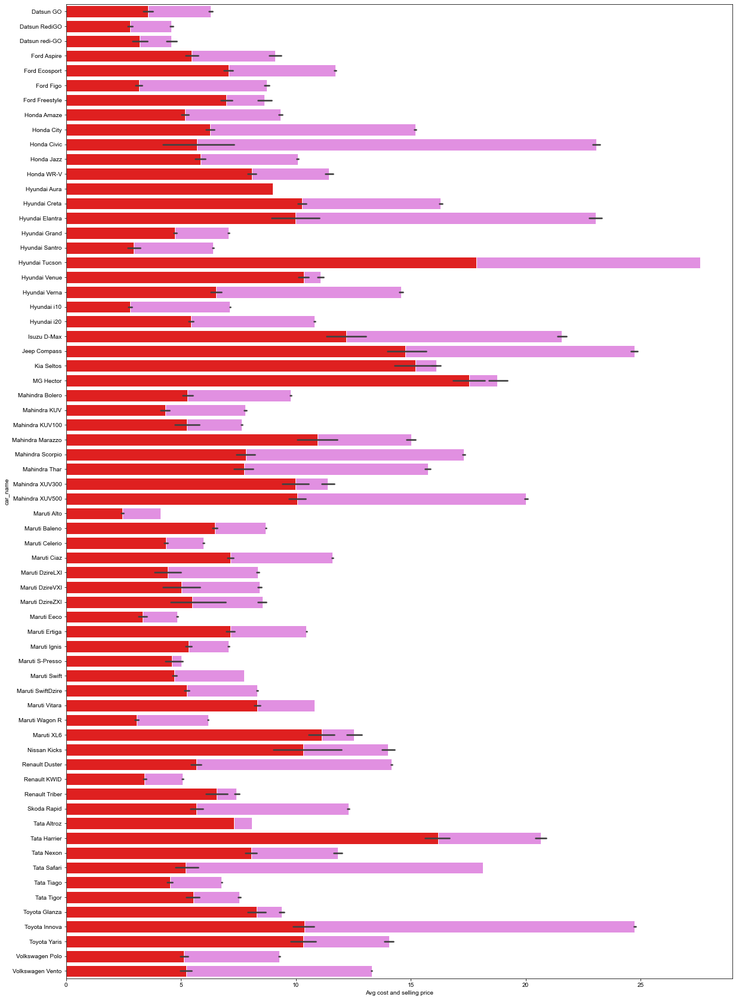

In [ ]:
selling_top = df_copy_2.sort_values(['avg_cost_price'],ascending=False)
fig, ax = plt.subplots(figsize=(20,30))

sns.set_theme(style="dark")

# # Histogram do not use
sns.set( rc = {"axes.facecolor": "gray"})
# ax = sns.histplot(data=selling_top, x='avg_cost_price', color='violet')

# # Bar plot
ax = sns.barplot(data=selling_top, x='avg_cost_price', y='car_name', color='violet')
ax = sns.barplot(data=selling_top,  x='selling_price', y='car_name', color='red')

plt.xlabel("Avg cost and selling price")
# plt.legend(loc="best") 

In [ ]:
# animals=['giraffes', 'orangutans', 'monkeys']
# # # Bar plot
# fig = go.Figure(data=[
#     go.Bar(name='average cost', y=selling_top.avg_cost_price, x=selling_top.car_name),
#     go.Bar(name='selling price', y=selling_top.selling_price, x=selling_top.car_name)
# ])
# # Change the bar mode
# fig.update_layout(barmode='group',height=400)
# fig.show()

In [ ]:
# fig = px.bar(selling_top, x="car_name", y=["avg_cost_price", "selling_price"],pattern_shape_sequence=["+", "x"])
# fig.show()

In [ ]:
# df_copy_2

In [ ]:
# practical pandas page 196

# df.iloc[row_idxs, column_idxs]
# df.loc[row_names, column_names]

In [ ]:
df_copy_2.shape

(13475, 14)

In [ ]:
df_copy_2.describe().T

,count,mean,std,min,25%,50%,75%,max
avg_cost_price,13475.0,10.604294,4.754087,3.810000,7.138267,9.585000,13.294659,27.600000
vehicle_age,13475.0,5.967347,2.990729,1.000000,4.000000,5.000000,8.000000,19.000000
km_driven,13475.0,53958.300781,34424.011719,100.000000,30000.000000,50000.000000,70000.000000,293000.000000
mileage,13475.0,20.314709,3.897993,9.000000,17.500000,20.299999,22.900000,33.540001
engine,13475.0,1368.204468,388.815308,793.000000,1197.000000,1248.000000,1498.000000,2956.000000
max_power,13475.0,88.585510,22.808090,38.400002,73.970001,83.800003,102.000000,189.000000
seats,13475.0,5.296178,0.770589,4.000000,5.000000,5.000000,5.000000,9.000000
selling_price,13475.0,5.696288,2.919135,0.450000,3.650000,5.250000,7.000000,22.250000


In [ ]:
def IQR_discovery(data,col):
    Q_1 = np.quantile(data[col],0.25)
    Q_3 = np.quantile(data[col],0.75)
    IQR = Q_3 - Q_1 
    print(f"IQR value for column {col} is: {IQR}")
    print(f"Min value for column {col} is: {data[col].min()}")
    print(f"Max value for column {col} is: {data[col].max()}\n")
    
out_columns = df_copy[['km_driven',
                'vehicle_age',
                'mileage',
                'engine',
                'max_power',
                'seats',
                'selling_price',
                'avg_cost_price'
                ]]  

for i in out_columns:
    IQR_discovery(df_copy_2, i)



IQR value for column km_driven is: 40000.0
Min value for column km_driven is: 100.0
Max value for column km_driven is: 293000.0

IQR value for column vehicle_age is: 4.0
Min value for column vehicle_age is: 1
Max value for column vehicle_age is: 19

IQR value for column mileage is: 5.399999618530273
Min value for column mileage is: 9.0
Max value for column mileage is: 33.540000915527344

IQR value for column engine is: 301.0
Min value for column engine is: 793.0
Max value for column engine is: 2956.0

IQR value for column max_power is: 28.029998779296875
Min value for column max_power is: 38.400001525878906
Max value for column max_power is: 189.0

IQR value for column seats is: 0.0
Min value for column seats is: 4
Max value for column seats is: 9

IQR value for column selling_price is: 3.3499999046325684
Min value for column selling_price is: 0.44999998807907104
Max value for column selling_price is: 22.25

IQR value for column avg_cost_price is: 6.1563920974731445
Min value for colum

**HISTOGRAMS**

In [ ]:
# sns.set( rc = None)
# fig, ax  = plt.subplots(1,3,figsize=(30,10))

# sns.histplot(df_copy_2,x='km_driven',kde=True,color='olive',bins=50,ax=ax[0]) # contains 5858 data points in one bin
# sns.histplot(df_copy_2,x='km_driven',kde=True,color='blue',binwidth=5000,ax=ax[1]) # # contains 50 bins 
# sns.histplot(df_copy_2,x='km_driven',kde=True,color='darkgreen',ax=ax[2]) # This in automatic
# ax[0].set_title(f'Skewness of km driven is: {df_copy_2.km_driven.skew()}',fontsize=14)
# ax[1].set_title(f'Skewness of km driven is: {df_copy_2.km_driven.skew()}',fontsize=14)
# ax[2].set_title(f'Skewness of km driven is: {df_copy_2.km_driven.skew()}',fontsize=14)
# # fig.tight_layout()
# fig.suptitle("Km_driven ",fontsize=30)

In [ ]:
# sns.set( rc = None)
# fig, ax  = plt.subplots(1,3,figsize=(30,10))

# sns.histplot(df_copy_2,x='mileage',kde=True,color='olive',bins=15,ax=ax[0]) # contains 1 data points in one bin
# sns.histplot(df_copy_2,x='mileage',kde=True,color='blue',binwidth=1,ax=ax[1]) # contains 15 bins 
# sns.histplot(df_copy_2,x='mileage',kde=True,color='darkgreen',ax=ax[2]) # This in automatic
# ax[0].set_title(f'Skewness of mileage is: {df_copy_2.mileage.skew()}',fontsize=14)
# ax[1].set_title(f'Skewness of mileage is: {df_copy_2.mileage.skew()}',fontsize=14)
# ax[2].set_title(f'Skewness of mileage is: {df_copy_2.mileage.skew()}',fontsize=14)
# # fig.tight_layout()
# fig.suptitle("mileage ",fontsize=30)

In [ ]:
# sns.set( rc = None)
# fig, ax  = plt.subplots(1,3,figsize=(30,10))

# sns.histplot(df_copy_2,x='engine',kde=True,color='olive',bins=20,ax=ax[0]) # contains 1 data points in one bin
# sns.histplot(df_copy_2,x='engine',kde=True,color='blue',binwidth=108.15,ax=ax[1]) # contains 15 bins 
# sns.histplot(df_copy_2,x='engine',kde=True,color='darkgreen',ax=ax[2]) # This in automatic
# ax[0].set_title(f'Skewness of engine is: {df_copy_2.engine.skew()}',fontsize=14)
# ax[1].set_title(f'Skewness of engine is: {df_copy_2.engine.skew()}',fontsize=14)
# ax[2].set_title(f'Skewness of engine is: {df_copy_2.engine.skew()}',fontsize=14)
# # fig.tight_layout()
# fig.suptitle("engine ",fontsize=30)

In [ ]:
# sns.set( rc = None)
# fig, ax  = plt.subplots(1,3,figsize=(30,10))

# sns.histplot(df_copy_2,x='max_power',kde=True,color='olive',bins=20,ax=ax[0]) # contains 1 data points in one bin
# sns.histplot(df_copy_2,x='max_power',kde=True,color='blue',binwidth=7.5,ax=ax[1]) # contains 15 bins 
# sns.histplot(df_copy_2,x='max_power',kde=True,color='darkgreen',ax=ax[2]) # This in automatic
# ax[0].set_title(f'Skewness of max_power is: {df_copy_2.max_power.skew()}',fontsize=14)
# ax[1].set_title(f'Skewness of max_power is: {df_copy_2.max_power.skew()}',fontsize=14)
# ax[2].set_title(f'Skewness of max_power is: {df_copy_2.max_power.skew()}',fontsize=14)
# # fig.tight_layout()
# fig.suptitle("Max power",fontsize=30)

In [ ]:
# sns.set( rc = None)
# fig, ax  = plt.subplots(1,3,figsize=(30,10))

# sns.histplot(df_copy_2,x='seats',kde=True,color='olive',bins=1,ax=ax[0]) # contains 1 data points in one bin
# sns.histplot(df_copy_2,x='seats',kde=True,color='blue',binwidth=5,ax=ax[1]) # contains 15 bins 
# sns.histplot(df_copy_2,x='seats',kde=True,color='darkgreen',ax=ax[2]) # This in automatic
# ax[0].set_title(f'Skewness of seats is: {df_copy_2.seats.skew()}',fontsize=14)
# ax[1].set_title(f'Skewness of seats is: {df_copy_2.seats.skew()}',fontsize=14)
# ax[2].set_title(f'Skewness of seats is: {df_copy_2.seats.skew()}',fontsize=14)
# # fig.tight_layout()
# fig.suptitle("Seats",fontsize=30)

In [ ]:
# sns.set( rc = None)
# fig, ax  = plt.subplots(1,3,figsize=(30,10))

# sns.histplot(df_copy_2,x='selling_price',kde=True,color='olive',bins=10,ax=ax[0]) # contains 1 data points in one bin
# sns.histplot(df_copy_2,x='selling_price',kde=True,color='blue',binwidth=2,ax=ax[1]) # contains 15 bins 
# sns.histplot(df_copy_2,x='selling_price',kde=True,color='darkgreen',ax=ax[2]) # This in automatic
# ax[0].set_title(f'Skewness of selling_price is: {df_copy_2.selling_price.skew()}',fontsize=14)
# ax[1].set_title(f'Skewness of selling_price is: {df_copy_2.selling_price.skew()}',fontsize=14)
# ax[2].set_title(f'Skewness of selling_price is: {df_copy_2.selling_price.skew()}',fontsize=14)
# # fig.tight_layout()
# fig.suptitle("Selling price",fontsize=30)

In [ ]:
# sns.set( rc = None)
# fig, ax  = plt.subplots(1,3,figsize=(30,10))

# sns.histplot(df_copy_2,x='avg_cost_price',kde=True,color='olive',bins=15,ax=ax[0]) # contains 1 data points in one bin
# sns.histplot(df_copy_2,x='avg_cost_price',kde=True,color='blue',binwidth=1,ax=ax[1]) # contains 15 bins 
# sns.histplot(df_copy_2,x='avg_cost_price',kde=True,color='darkgreen',ax=ax[2]) # This in automatic
# ax[0].set_title(f'Skewness of avg_cost_price is: {df_copy_2.avg_cost_price.skew()}',fontsize=14)
# ax[1].set_title(f'Skewness of avg_cost_price is: {df_copy_2.avg_cost_price.skew()}',fontsize=14)
# ax[2].set_title(f'Skewness of avg_cost_price is: {df_copy_2.avg_cost_price.skew()}',fontsize=14)
# # fig.tight_layout()
# fig.suptitle("Average cost ",fontsize=30)

In [ ]:
# sns.set( rc = None)
# fig, ax  = plt.subplots(1,3,figsize=(30,10))

# sns.histplot(df_copy_2,x='vehicle_age',kde=True,color='olive',bins=36,ax=ax[0]) # contains 1 data point in one bin
# sns.histplot(df_copy_2,x='vehicle_age',kde=True,color='blue',binwidth=0.5,ax=ax[1]) # contains 15 bins 
# sns.histplot(df_copy_2,x='vehicle_age',kde=True,color='darkgreen',ax=ax[2]) # This in automatic
# ax[0].set_title(f'Skewness of age is: {df_copy_2.vehicle_age.skew()}',fontsize=14)
# ax[1].set_title(f'Skewness of age is: {df_copy_2.vehicle_age.skew()}',fontsize=14)
# ax[2].set_title(f'Skewness of age is: {df_copy_2.vehicle_age.skew()}',fontsize=14)
# # fig.tight_layout()
# fig.suptitle("Vehicle age ",fontsize=30)

**Final Histogram plot**

In [ ]:
nums = df_copy_2.select_dtypes(include=np.number)
nums

,avg_cost_price,vehicle_age,km_driven,mileage,engine,max_power,seats,selling_price
0,4.112027,9,120000.0,19.700001,796.0,46.299999,5,1.20
1,7.295000,5,20000.0,18.900000,1197.0,82.000000,5,5.50
2,10.810042,11,60000.0,17.000000,1197.0,80.000000,5,2.15
3,4.112027,9,37000.0,20.920000,998.0,67.099998,5,2.26
4,11.965000,6,30000.0,22.770000,1498.0,98.589996,5,5.70
...,...,...,...,...,...,...,...,...
19966,7.071195,5,9229.0,18.900000,1197.0,82.000000,5,5.45
19967,7.138267,9,10723.0,19.809999,1086.0,68.050003,5,2.50
19970,10.457891,2,18000.0,17.500000,1373.0,91.099998,7,9.25
19971,12.280918,6,67000.0,21.139999,1498.0,103.519997,5,4.25


\begin{equation*} \text{bin width} = (max - min) / \text{no. of bins} \end{equation*}

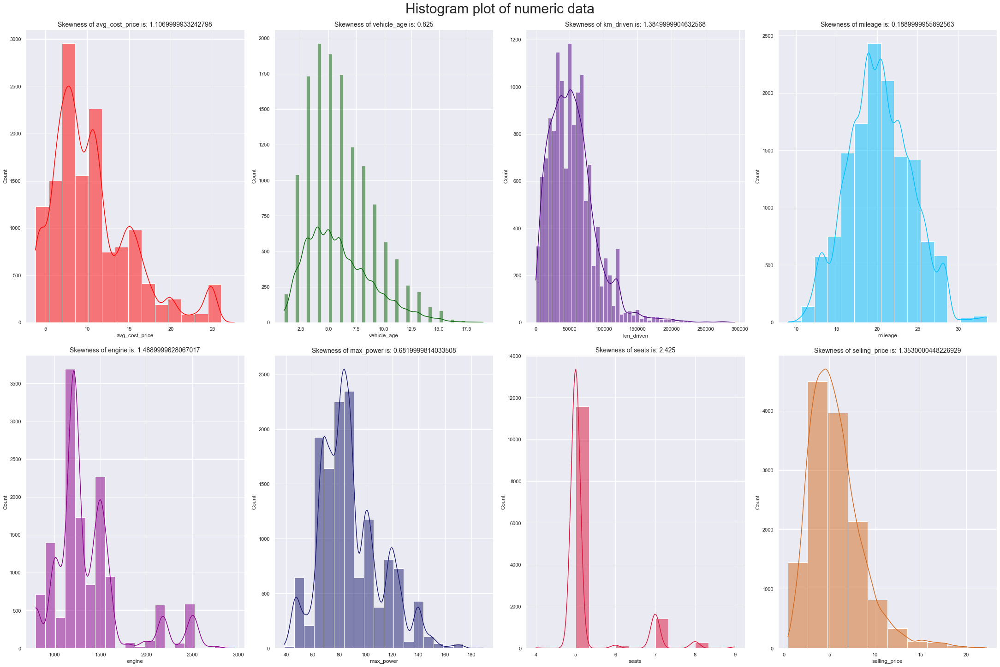

In [ ]:
sns.set( rc = None)
nums = df_copy_2.select_dtypes(include=np.number)
# nums
fig, ax = plt.subplots(2,4,figsize=(30,20),constrained_layout=True)
ax = ax.ravel()
colors_list = ['red',
                'darkgreen',
                'indigo','deepskyblue','darkmagenta',
                'midnightblue','crimson','chocolate']
bins_spec = [15,'auto',50,15,20,20,'auto',10]

for index,value in enumerate(nums):
        sns.histplot(data=nums,x=value,kde=True,color=colors_list[index],ax=ax[index],bins=bins_spec[index])
        ax[index].set_title(f'Skewness of {value} is: {np.around(nums[value].skew(axis=0),3)}',fontsize=14)
        fig.suptitle("Histogram plot of numeric data",fontsize=30)
        # print(nums[value])

**Using Log to correct skewness**

Levels of skewness
1. (-0.5,0.5) = lowly skewed
2. (-1,-0.5) U (0.5,1) = Moderately skewed
3. (-1 & beyond ) U (1 & beyond) = Highly skewed

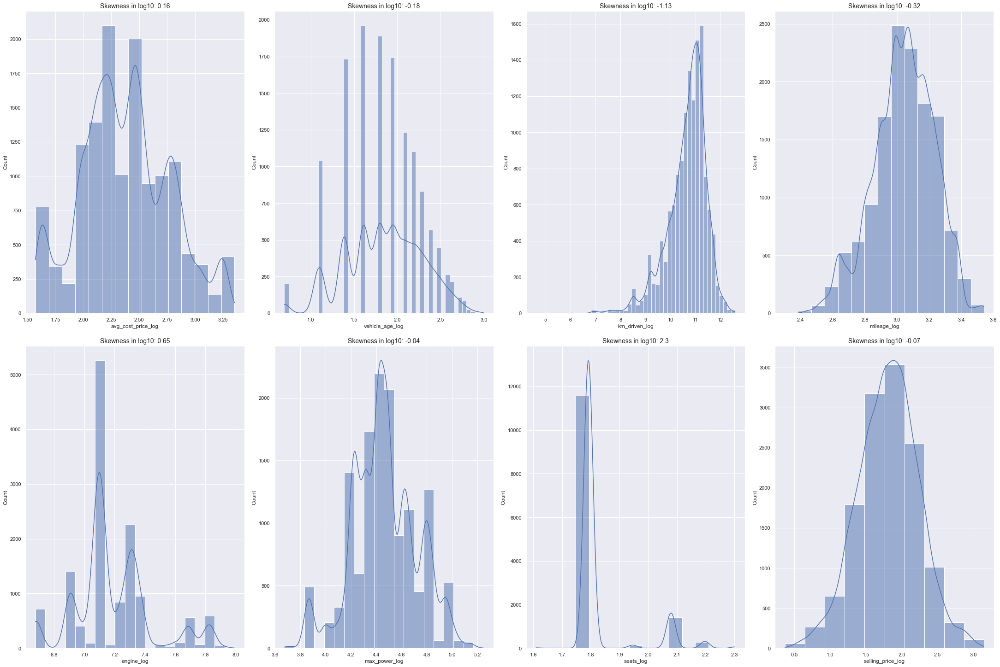

In [ ]:
fig, ax = plt.subplots(2,4, figsize=(30,20), constrained_layout=True)
ax = ax.ravel()
sns.set_theme(rc=None)
df_copy_log = df_copy_2.copy()
# row, column - (1,1),-> (1,'hdlngth'), (1,2) -> (1 ,'skullw')
# It's accessing the list
bins_spec = [15,'auto',50,15,20,20,'auto',10]
for index, value in enumerate(nums):
    log = (f'{value}_log')
    df_copy_log[log] = df_copy_log[value].apply(lambda x: np.log(x+1))
    sns.histplot(x=log, data=df_copy_log, ax=ax[index], kde=True,bins=bins_spec[index])
    ax[index].set_title(f"Skewness in log10: {np.around(df_copy_log[log].skew(axis=0),2)}",fontsize=14)

In [ ]:
for value in df_copy_log.select_dtypes(include=np.number):
    print(f'Skewness of {value} is: {np.around(df_copy_log[value].skew(axis=0),3)}')

Skewness of avg_cost_price is: 1.1069999933242798
Skewness of vehicle_age is: 0.825
Skewness of km_driven is: 1.3849999904632568
Skewness of mileage is: 0.1889999955892563
Skewness of engine is: 1.4889999628067017
Skewness of max_power is: 0.6819999814033508
Skewness of seats is: 2.425
Skewness of selling_price is: 1.3530000448226929
Skewness of avg_cost_price_log is: 0.16
Skewness of vehicle_age_log is: -0.183
Skewness of km_driven_log is: -1.127
Skewness of mileage_log is: -0.32
Skewness of engine_log is: 0.654
Skewness of max_power_log is: -0.041
Skewness of seats_log is: 2.304
Skewness of selling_price_log is: -0.07


In [ ]:
X_mix = ['seats','max_power_log','engine_log','mileage','km_driven','vehicle_age_log','avg_cost_log']
y_regular = ['selling_price']
y_log = ['selling_price_log']

# Log then scale
# https://stats.stackexchange.com/questions/402470/how-can-i-use-scaling-and-log-transforming-together

In [ ]:
df_copy_2.select_dtypes(include='category').describe()

,car_name,brand,model,seller_type,fuel_type,transmission_type
count,13475,13475,13475,13475,13475,13475
unique,66,16,66,3,4,2
top,Hyundai i20,Maruti,i20,Dealer,Petrol,Manual
freq,906,4898,906,7916,7278,11812


**Count plot**

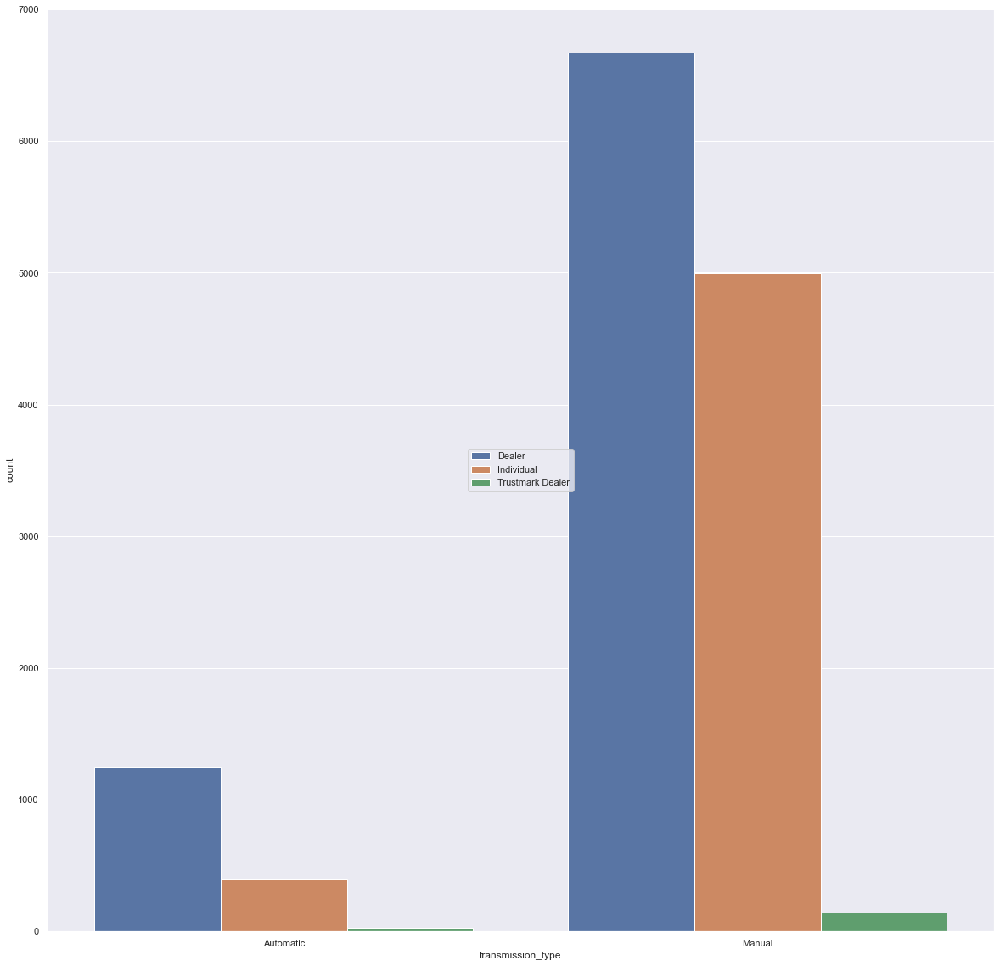

In [ ]:
fig,ax = plt.subplots(figsize=(20,20))
sns.countplot(data=df_copy_2,x='transmission_type',hue='seller_type')
plt.legend(loc='center')

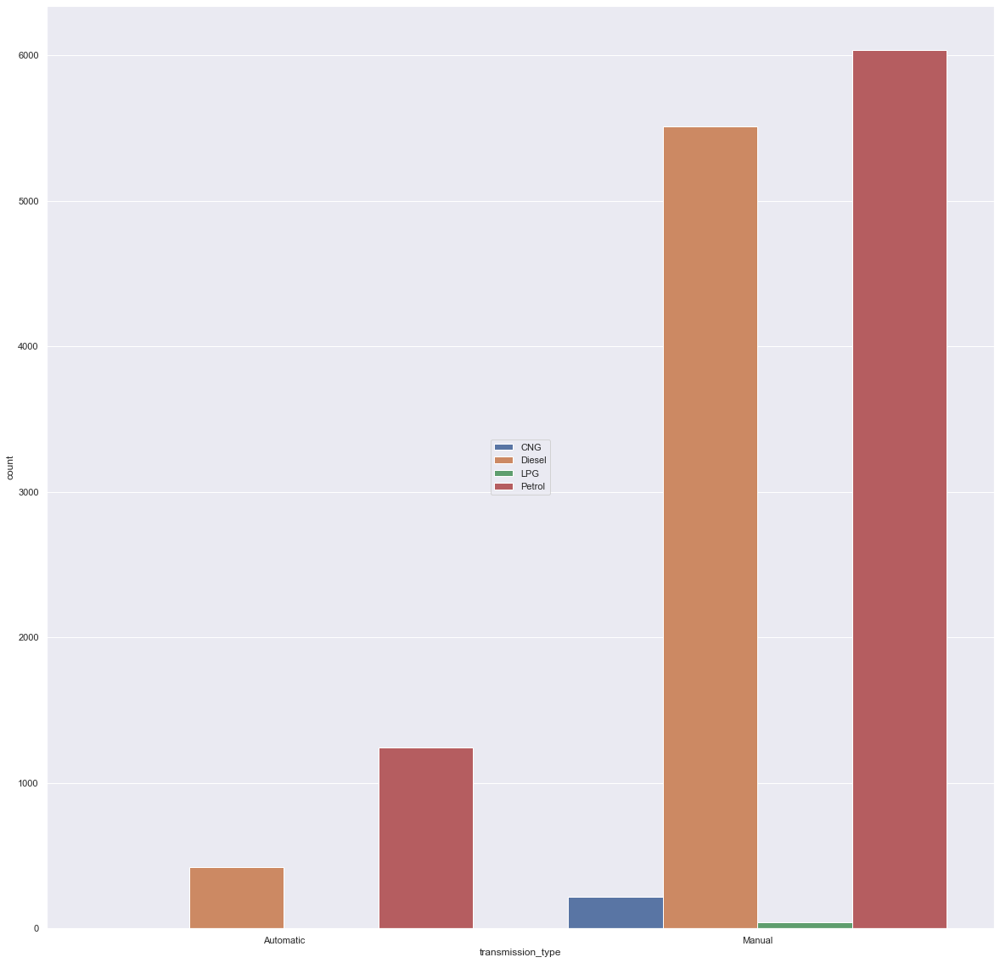

In [ ]:
fig,ax = plt.subplots(figsize=(20,20))
sns.countplot(data=df_copy_2,x='transmission_type',hue='fuel_type')
plt.legend(loc='center')

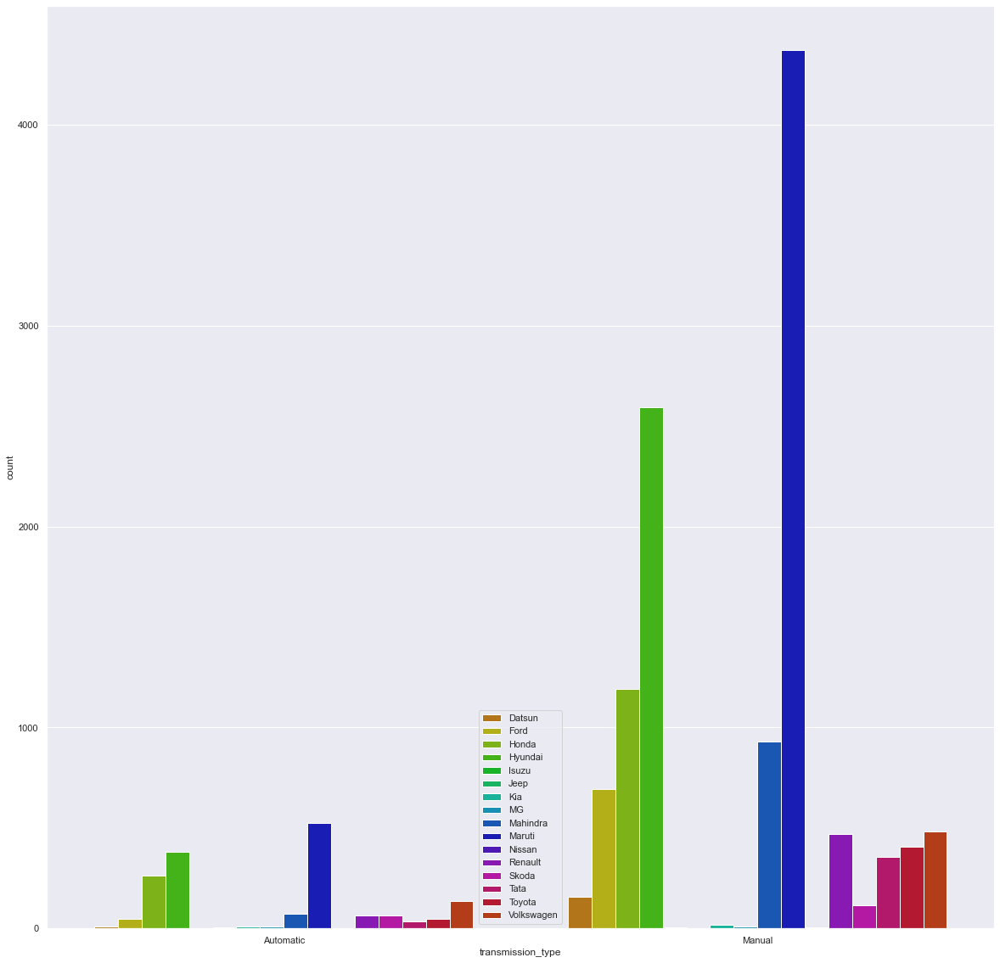

In [ ]:
fig,ax = plt.subplots(figsize=(20,20))
mine = sns.hls_palette(16,h=0.1, l=0.4, s=1)
sns.countplot(data=df_copy_2,x='transmission_type',hue='brand',palette=mine)
plt.legend(loc='lower center')

In [ ]:
fig =px.bar(df_copy_2,x='transmission_type'
                    ,y='selling_price'
                    ,color='brand'
                    ,barmode='group'
                    ,height=600,color_discrete_sequence=px.colors.qualitative.Dark24)
# fig.update_layout(colorscale={'diverging':[0, (5,10,172)]})
# fig.update_layout(plot_bgcolor='white')
fig.show()

# https://plotly.com/python/discrete-color/#color-sequences-in-plotly-express

**Box plot**

In [ ]:
# Creating a list of obejcts
objects = df_copy_2.select_dtypes(include='category').columns.tolist()

In [ ]:
# model is index 1
# brand & car_name is index 0 
# All  were popped
objects.pop(1)

'brand'

In [ ]:
objects.pop(0)

'car_name'

In [ ]:
objects.pop(0)

'model'

In [ ]:
objects

['seller_type', 'fuel_type', 'transmission_type']

Text(0.5, 1.0, 'The box plot of Brand')

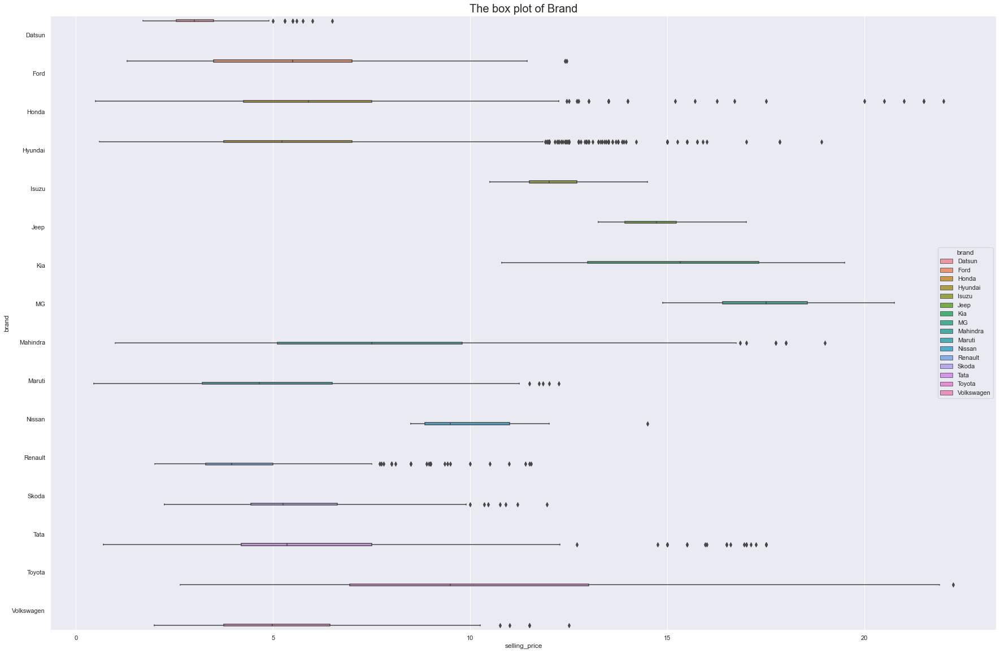

In [ ]:
# The outliers is n
fig,ax = plt.subplots(figsize=(30,20))
sns.set_theme(style="darkgrid", palette="pastel")
sns.boxplot(data=df_copy_2,y='brand',x='selling_price',hue='brand')
ax.set_title(f'The box plot of Brand',fontdict={'size':20})

**Observation**
- It seems Datsun has the lowest range of selling price; Cheapest car brand.
- Toyota and Mahindra show a large range of selling price.
- MG selling price range begins above 10Lakh.
- Isuzu, Kia, Jeep, & MG show no presence of outliers. Probably due to their high selling price starting value; Expensive car brands.
- Both Toyota and Nassan has only one outlier.
- Hyundai seems to have the highest number of outliers.
- Toyota seems to be the most expensive car brand.
- 50% of Toyota cars have a selling price of at least 9Lakh (Median)
- 75% of the Toyota brand is below 13Lakh (3rd quartile)

In [ ]:
objects

['seller_type', 'fuel_type', 'transmission_type']

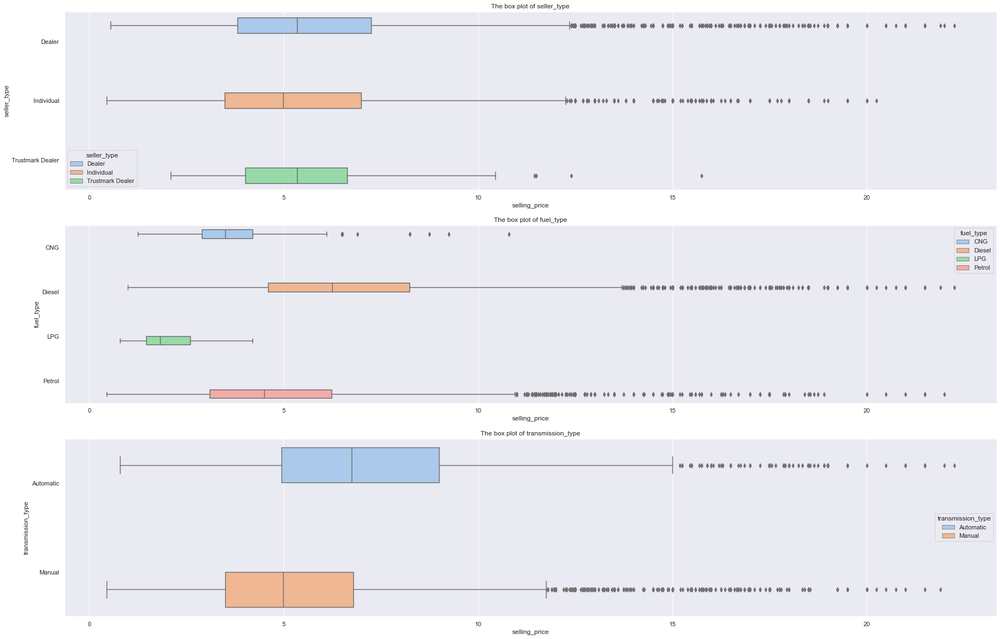

In [ ]:
fig,ax = plt.subplots(3, figsize=(30,20))
for index,value in enumerate(objects):
    sns.boxplot(data=df_copy_2,y=value,x='selling_price',hue=value,ax=ax[index])
    ax[index].set_title(f'The box plot of {value}')

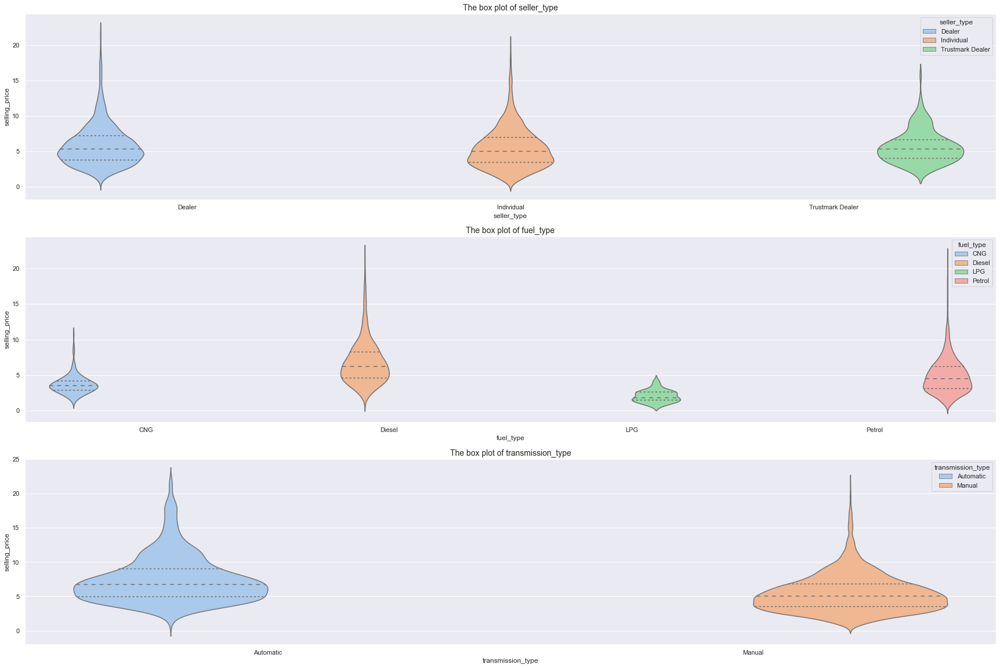

In [ ]:
fig,ax = plt.subplots(3, figsize=(30,20))
for index,value in enumerate(objects):
    sns.violinplot(data=df_copy_2,x=value,y='selling_price',hue=value,ax=ax[index],inner='quartile') # point,quartile,box,stick; quartile seems to be the best choice
    ax[index].set_title(f'The box plot of {value}', fontsize=14)

**Observations**
- Based on seller type, in descending order of selling price, we can see a decrease in selling price from Dealer down to Trusmark dealer.
- Based on seller type for individuals, 50% of the selling price is at least 5Lakh
- Individual sellers has a lower selling price starting when compared to Trustmark dealer and Dealer
- Trustmark dealer selling price is usually below 11Lakh; everything above is considered an outlier
- Based on fuel type, selling price can be arranged in an ascending order i.e. LPG, CNG, petrol, and finally Diesel.
- LPG has no outliers
- 50% Diesel cars' selling price value are considerably greater than 75% of petrol cars'.
- Based on transmission type, selling price of Automatic cars is considerably greater than that of manual cars.
- Automatic cars selling price is usually below 15Lakh; everything above is considered an outlier
- 50% of Manual cars' selling price is 5Lakh, also the starting value selling price is lower than that of automatic cars.
- 50% automatic cars' selling price value are considerably greater than 75% of manual cars'.

**Heat Map**

<AxesSubplot:>

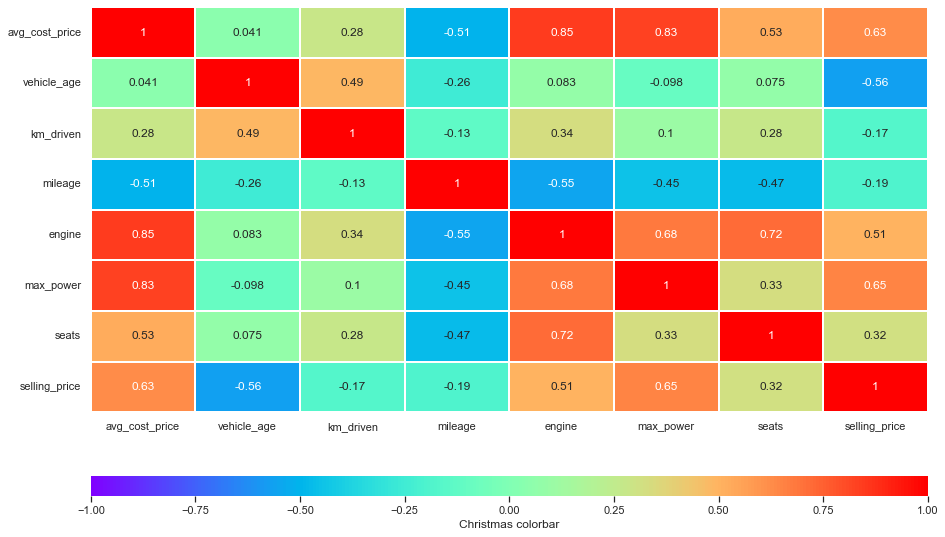

In [ ]:
# Horizontal orientation
# https://matplotlib.org/stable/tutorials/colors/colormaps.html
sns.set_theme()
grid_kws = {"height_ratios": (1,.05),"hspace":.3}
fig,(ax, cbar_ax) =plt.subplots(2,figsize=(15, 9),gridspec_kw=grid_kws)
sns.heatmap(df_copy_2.corr(),
            # yticklabels=1,
            # xticklabels=False,
            ax=ax,
            cbar_ax=cbar_ax,
            cmap="rainbow", #Miscellaneous
            annot=True,
            vmin=-1,
            vmax=1,
            cbar_kws={"orientation":"horizontal",'label':"Christmas colorbar"},
            linewidths=1
            )

**Observations**
- Average cost price, engine, max power and seats are positively correlated with selling price
- Vehicle age, km driven and mileage are negatively correlated with selling price
- Max power is positively highly correlated with selling price.

**Line plot**

In [ ]:
nums.describe().T

,count,mean,std,min,25%,50%,75%,max
avg_cost_price,13475.0,10.604294,4.754087,3.810000,7.138267,9.585000,13.294659,27.600000
vehicle_age,13475.0,5.967347,2.990729,1.000000,4.000000,5.000000,8.000000,19.000000
km_driven,13475.0,53958.300781,34424.011719,100.000000,30000.000000,50000.000000,70000.000000,293000.000000
mileage,13475.0,20.314709,3.897993,9.000000,17.500000,20.299999,22.900000,33.540001
engine,13475.0,1368.204468,388.815308,793.000000,1197.000000,1248.000000,1498.000000,2956.000000
max_power,13475.0,88.585510,22.808090,38.400002,73.970001,83.800003,102.000000,189.000000
seats,13475.0,5.296178,0.770589,4.000000,5.000000,5.000000,5.000000,9.000000
selling_price,13475.0,5.696288,2.919135,0.450000,3.650000,5.250000,7.000000,22.250000


In [ ]:
nums.iloc[:5,:7]

,avg_cost_price,vehicle_age,km_driven,mileage,engine,max_power,seats
0,4.112027,9,120000.0,19.700001,796.0,46.299999,5
1,7.295000,5,20000.0,18.900000,1197.0,82.000000,5
2,10.810042,11,60000.0,17.000000,1197.0,80.000000,5
3,4.112027,9,37000.0,20.920000,998.0,67.099998,5
4,11.965000,6,30000.0,22.770000,1498.0,98.589996,5


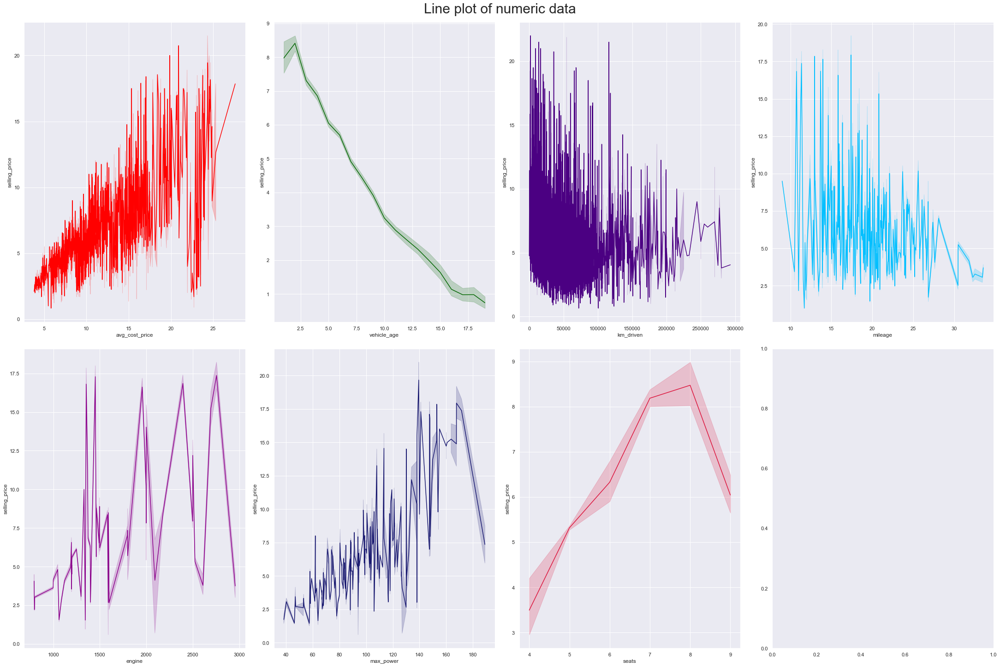

In [ ]:
# nums = df_copy_2.select_dtypes(include=np.number)
# nums
sns.set_theme(style='dark')
# sns.set_theme(style='darkgrid')
fig, ax = plt.subplots(2,4,figsize=(30,20),constrained_layout=True)
# plt.grid(True)
ax = ax.ravel()
colors_list = ['red',
                'darkgreen',
                'indigo','deepskyblue','darkmagenta',
                'midnightblue','crimson','chocolate']
# bins_spec = [15,'auto',50,15,20,20,'auto',10]

for index,value in enumerate(nums.iloc[:,:7]):
        sns.lineplot(data=nums,x=value,y='selling_price',color=colors_list[index],ax=ax[index])
        # ax[index].xlabel(fontsize=14)
        fig.suptitle("Line plot of numeric data",fontsize=30)
        ax[index].grid(True)
        # print(nums[value])
        

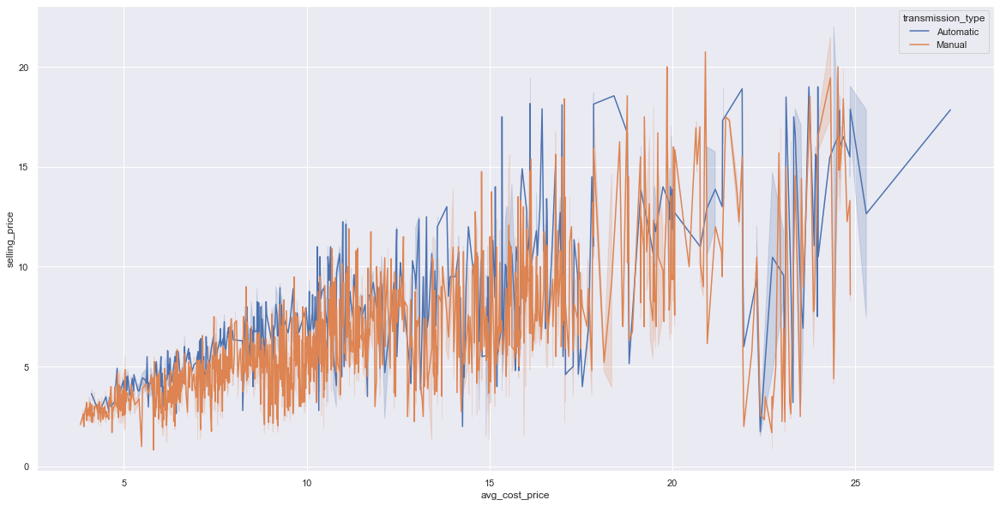

In [ ]:
fig,ax = plt.subplots(figsize=(20,10))
sns.lineplot(data=df_copy_2,x='avg_cost_price',y='selling_price',hue='transmission_type')
ax.grid(True)

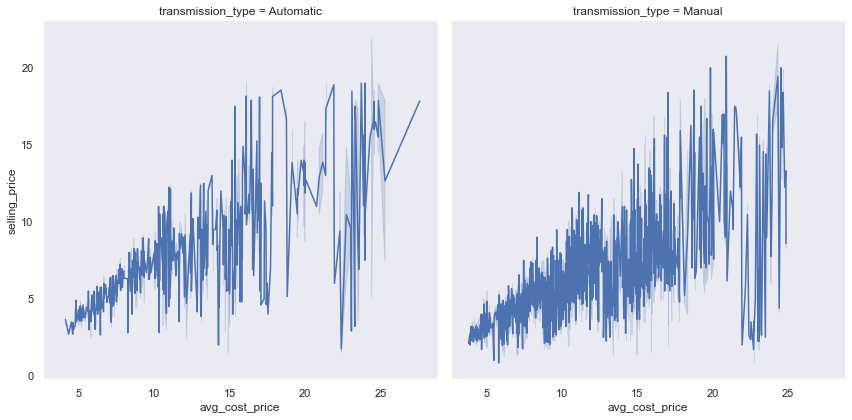

In [ ]:
sns.relplot(data=df_copy_2,col="transmission_type",
x='avg_cost_price',
y='selling_price',
kind='line',height=6,
palette='colorblind'
)

In [ ]:
# Using Plotly for plotting
fig = px.line(df_copy_2.sort_values('avg_cost_price'), x='avg_cost_price',
y='selling_price',title="Average cost vs Selling price",color='transmission_type') #,markers=True
fig.show()

**Observations**
- Based off the heatmap and line plot average cost price, engine, max power and seats are positively correlated with selling price
- Based of the heatmap and line plot vehicle age, km driven and mileage are negatively correlated with selling price; as vehicle age, km driven and mileage increase, there is a decrease in selling price.
- From the line plot, a used car of at least 2 years seems to have a high selling price, beyond 2 years the selling has a steep decrease.
- Based of the line plot, we can see that automatic cars' average cost price is higher that manual cars'.

**Regression plot**

In [ ]:
# fig,ax = plt.subplots(figsize=(20,10))
# sns.regplot(data=df_copy_2,x='max_power',y='selling_price',robust=True,fit_reg=True,scatter_kws={'alpha':0.3},line_kws={'color':'red','alpha':0.4}) # x_estimator=np.mean

In [ ]:
# sns.catplot(data=df_copy_2,x='seats',y='selling_price',kind='violin',hue='transmission_type')

In [ ]:
df_copy_2.dtypes

car_name             category
brand                category
model                category
avg_cost_price        float32
vehicle_age              int8
km_driven             float32
seller_type          category
fuel_type            category
transmission_type    category
mileage               float32
engine                float32
max_power             float32
seats                    int8
selling_price         float32
dtype: object

## Model building 
+ In this section different algorithms will be applied such as; Kmeans clustering,KNN, PCA and regression methods.
+ Before the application of each model a scaler shall be applied to it to ensure accuracy and precision.

- Columns to be explored;
    + Brand
    + Fuel type
    + Seller type
    + Transmission type
    + Selling price

In [ ]:
df_copy_log.columns

Index(['car_name', 'brand', 'model', 'avg_cost_price', 'vehicle_age',
       'km_driven', 'seller_type', 'fuel_type', 'transmission_type', 'mileage',
       'engine', 'max_power', 'seats', 'selling_price', 'avg_cost_price_log',
       'vehicle_age_log', 'km_driven_log', 'mileage_log', 'engine_log',
       'max_power_log', 'seats_log', 'selling_price_log'],
      dtype='object')

In [ ]:
X_mix = ['seats','max_power_log','engine_log','mileage','km_driven','vehicle_age_log','avg_cost_price_log']
y_regular = ['selling_price']
y_log = ['selling_price_log']

### **Use of Clustering Algorithms**

In [ ]:
X_mix_kmean = ['seats','max_power_log','engine_log','mileage','km_driven','vehicle_age_log','avg_cost_price_log','selling_price_log']

In [ ]:
df_kmeans = df_copy_log[X_mix_kmean]

In [ ]:
df_kmeans[['seller_type','fuel_type','transmission_type']] = df_copy_2[objects]
df_kmeans

,seats,max_power_log,engine_log,mileage,km_driven,vehicle_age_log,avg_cost_price_log,selling_price_log,seller_type,fuel_type,transmission_type
0,5,3.856510,6.680855,19.700001,120000.0,2.302585,1.631596,0.788457,Individual,Petrol,Manual
1,5,4.418841,7.088409,18.900000,20000.0,1.791759,2.115653,1.871802,Individual,Petrol,Manual
2,5,4.394449,7.088409,17.000000,60000.0,2.484907,2.468950,1.147402,Individual,Petrol,Manual
3,5,4.220977,6.906755,20.920000,37000.0,2.302585,1.631596,1.181727,Individual,Petrol,Manual
4,5,4.601062,7.312553,22.770000,30000.0,1.945910,2.562253,1.902107,Dealer,Diesel,Manual
...,...,...,...,...,...,...,...,...,...,...,...
19966,5,4.418841,7.088409,18.900000,9229.0,1.791759,2.088302,1.864080,Dealer,Petrol,Manual
19967,5,4.234831,6.991177,19.809999,10723.0,2.302585,2.096577,1.252763,Dealer,Petrol,Manual
19970,7,4.522875,7.225481,17.500000,18000.0,1.098612,2.438679,2.327278,Dealer,Petrol,Manual
19971,5,4.649378,7.312553,21.139999,67000.0,1.945910,2.586328,1.658228,Dealer,Diesel,Manual


In [ ]:
df_kmeans[['model','brand']] = df_copy_2[['model','brand']]
df_kmeans

,seats,max_power_log,engine_log,mileage,km_driven,vehicle_age_log,avg_cost_price_log,selling_price_log,seller_type,fuel_type,transmission_type,model,brand
0,5,3.856510,6.680855,19.700001,120000.0,2.302585,1.631596,0.788457,Individual,Petrol,Manual,Alto,Maruti
1,5,4.418841,7.088409,18.900000,20000.0,1.791759,2.115653,1.871802,Individual,Petrol,Manual,Grand,Hyundai
2,5,4.394449,7.088409,17.000000,60000.0,2.484907,2.468950,1.147402,Individual,Petrol,Manual,i20,Hyundai
3,5,4.220977,6.906755,20.920000,37000.0,2.302585,1.631596,1.181727,Individual,Petrol,Manual,Alto,Maruti
4,5,4.601062,7.312553,22.770000,30000.0,1.945910,2.562253,1.902107,Dealer,Diesel,Manual,Ecosport,Ford
...,...,...,...,...,...,...,...,...,...,...,...,...,...
19966,5,4.418841,7.088409,18.900000,9229.0,1.791759,2.088302,1.864080,Dealer,Petrol,Manual,Grand,Hyundai
19967,5,4.234831,6.991177,19.809999,10723.0,2.302585,2.096577,1.252763,Dealer,Petrol,Manual,i10,Hyundai
19970,7,4.522875,7.225481,17.500000,18000.0,1.098612,2.438679,2.327278,Dealer,Petrol,Manual,Ertiga,Maruti
19971,5,4.649378,7.312553,21.139999,67000.0,1.945910,2.586328,1.658228,Dealer,Diesel,Manual,Rapid,Skoda


In [ ]:
df_kmeans.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13475 entries, 0 to 19973
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   seats               13475 non-null  int8    
 1   max_power_log       13475 non-null  float64 
 2   engine_log          13475 non-null  float64 
 3   mileage             13475 non-null  float32 
 4   km_driven           13475 non-null  float32 
 5   vehicle_age_log     13475 non-null  float64 
 6   avg_cost_price_log  13475 non-null  float64 
 7   selling_price_log   13475 non-null  float64 
 8   seller_type         13475 non-null  category
 9   fuel_type           13475 non-null  category
 10  transmission_type   13475 non-null  category
 11  model               13475 non-null  category
 12  brand               13475 non-null  category
dtypes: category(5), float32(2), float64(5), int8(1)
memory usage: 1.3 MB


In [ ]:
df_kmeans.select_dtypes(include=np.number).columns

Index(['seats', 'max_power_log', 'engine_log', 'mileage', 'km_driven',
       'vehicle_age_log', 'avg_cost_price_log', 'selling_price_log'],
      dtype='object')

In [ ]:
df_kmeans.select_dtypes(exclude=np.number).columns

Index(['seller_type', 'fuel_type', 'transmission_type', 'model', 'brand'], dtype='object')

In [ ]:
slice(0,10)

slice(0, 10, None)

In [ ]:
from sklearn.preprocessing import  StandardScaler,MinMaxScaler,RobustScaler,LabelEncoder
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans,AgglomerativeClustering,DBSCAN
from yellowbrick.cluster import KElbowVisualizer,SilhouetteVisualizer
from scipy.cluster.hierarchy import dendrogram
from sklearn.metrics import silhouette_score,silhouette_samples,adjusted_rand_score, normalized_mutual_info_score

In [ ]:
# Use get dummies to encode the categorical part of the data
dummies = pd.get_dummies(df_kmeans)

In [ ]:
dummies

,seats,max_power_log,engine_log,mileage,km_driven,vehicle_age_log,avg_cost_price_log,selling_price_log,seller_type_Dealer,seller_type_Individual,...,brand_Kia,brand_MG,brand_Mahindra,brand_Maruti,brand_Nissan,brand_Renault,brand_Skoda,brand_Tata,brand_Toyota,brand_Volkswagen
0,5,3.856510,6.680855,19.700001,120000.0,2.302585,1.631596,0.788457,0,1,...,0,0,0,1,0,0,0,0,0,0
1,5,4.418841,7.088409,18.900000,20000.0,1.791759,2.115653,1.871802,0,1,...,0,0,0,0,0,0,0,0,0,0
2,5,4.394449,7.088409,17.000000,60000.0,2.484907,2.468950,1.147402,0,1,...,0,0,0,0,0,0,0,0,0,0
3,5,4.220977,6.906755,20.920000,37000.0,2.302585,1.631596,1.181727,0,1,...,0,0,0,1,0,0,0,0,0,0
4,5,4.601062,7.312553,22.770000,30000.0,1.945910,2.562253,1.902107,1,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19966,5,4.418841,7.088409,18.900000,9229.0,1.791759,2.088302,1.864080,1,0,...,0,0,0,0,0,0,0,0,0,0
19967,5,4.234831,6.991177,19.809999,10723.0,2.302585,2.096577,1.252763,1,0,...,0,0,0,0,0,0,0,0,0,0
19970,7,4.522875,7.225481,17.500000,18000.0,1.098612,2.438679,2.327278,1,0,...,0,0,0,1,0,0,0,0,0,0
19971,5,4.649378,7.312553,21.139999,67000.0,1.945910,2.586328,1.658228,1,0,...,0,0,0,0,0,0,1,0,0,0


In [ ]:
dummies_1 = dummies.copy()

Text(0.5, 1.0, 'Standard Scaler')

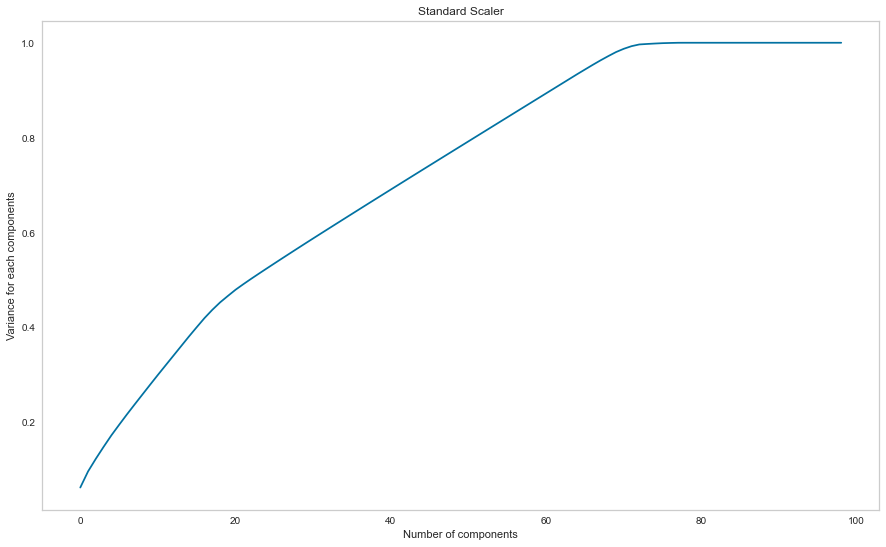

In [ ]:
scaler1 = StandardScaler()
scaler2 = MinMaxScaler()
scaler3 = RobustScaler()
dummies1_scaled = scaler1.fit_transform(dummies_1)
pca = PCA().fit(dummies1_scaled)
pca_data = pca.transform(dummies1_scaled)
#plotting the cumulative summation of the explained variance
fig, ax = plt.subplots(figsize=(15,9)) # W,L
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of components')
plt.ylabel('Variance for each components')
plt.plot()
plt.grid()
plt.title("Standard Scaler")

Text(0.5, 1.0, 'MinMax Scaler')

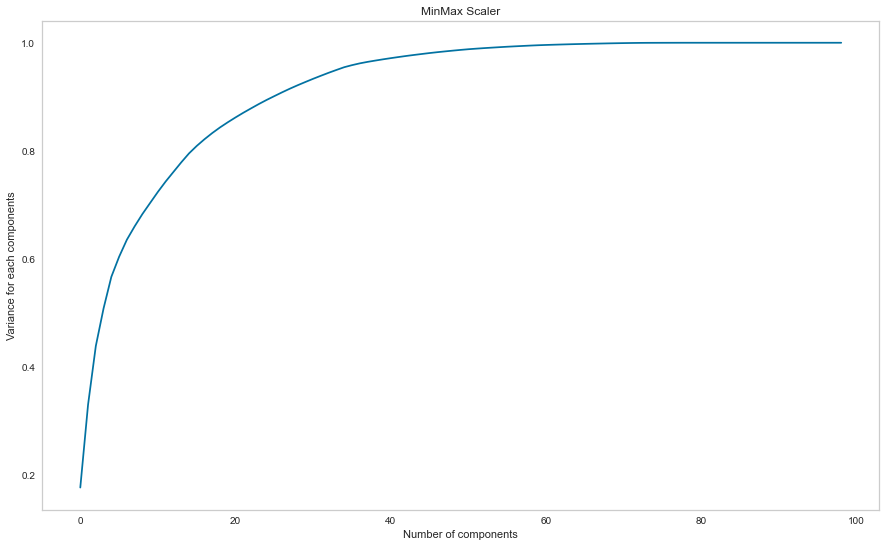

In [ ]:
scaler1 = StandardScaler()
scaler2 = MinMaxScaler()
scaler3 = RobustScaler()
dummies1_scaled = scaler2.fit_transform(dummies_1)
pca = PCA().fit(dummies1_scaled)
pca_data = pca.transform(dummies1_scaled)
#plotting the cumulative summation of the explained variance
fig, ax = plt.subplots(figsize=(15,9)) # W,L
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of components')
plt.ylabel('Variance for each components')
plt.plot()
plt.grid()
plt.title("MinMax Scaler")

Text(0.5, 1.0, 'Robust Scaler')

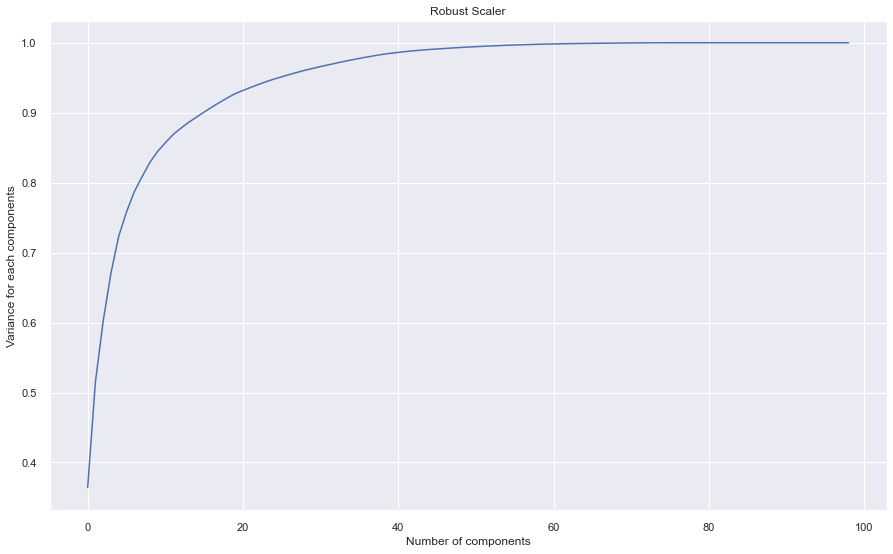

In [ ]:
scaler1 = StandardScaler()
scaler2 = MinMaxScaler()
scaler3 = RobustScaler()
dummies1_scaled = scaler3.fit_transform(dummies_1)
pca = PCA().fit(dummies1_scaled)
pca_data = pca.transform(dummies1_scaled)
#plotting the cumulative summation of the explained variance
sns.set_theme(style='darkgrid')
fig, ax = plt.subplots(figsize=(15,9)) # W,L
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of components')
plt.ylabel('Variance for each components')
plt.plot()
plt.title("Robust Scaler")
# Make use of Robust scaler instead

From the three scalers Robust scaler is more favourable in reduction of features to be used while using a PCA.

In [ ]:
exp_var_cumsum = pd.Series(np.round(pca.explained_variance_ratio_.cumsum(),4)*100)

for index,var in enumerate(exp_var_cumsum):
    print(f'If pca components is: {index}    Variance: {np.around(var,3)}')

# .90 gives about 16 components which explains the data

If pca components is: 0    Variance: 36.42
If pca components is: 1    Variance: 51.53
If pca components is: 2    Variance: 60.24
If pca components is: 3    Variance: 67.08
If pca components is: 4    Variance: 72.34
If pca components is: 5    Variance: 75.8
If pca components is: 6    Variance: 78.69
If pca components is: 7    Variance: 80.83
If pca components is: 8    Variance: 82.87
If pca components is: 9    Variance: 84.46
If pca components is: 10    Variance: 85.69
If pca components is: 11    Variance: 86.87
If pca components is: 12    Variance: 87.78
If pca components is: 13    Variance: 88.61
If pca components is: 14    Variance: 89.36
If pca components is: 15    Variance: 90.09
If pca components is: 16    Variance: 90.8
If pca components is: 17    Variance: 91.48
If pca components is: 18    Variance: 92.12
If pca components is: 19    Variance: 92.72
If pca components is: 20    Variance: 93.18
If pca components is: 21    Variance: 93.62
If pca components is: 22    Variance: 94.04


In [ ]:
pca2 = PCA(n_components=.90)
pca2.fit(dummies1_scaled)
# x_pca = fit_transform(dummies1_scaled)
x_pca = pca2.transform(dummies1_scaled)

In [ ]:
x_pca[:2]

array([[-3.23748354,  2.64435657, -0.04749701,  0.81791705, -0.38521297,
         0.88005605,  0.40431477, -0.13687346,  0.16539271,  0.066916  ,
         0.07616542,  0.21398585, -0.18271515,  0.27377633, -0.26724428,
         0.01440353],
       [-0.75981605, -0.62509628, -0.7152574 ,  0.51964972, -0.89321546,
        -0.60405412,  0.41116405,  0.11678417, -0.29685082, -0.10452659,
        -0.13290522, -0.09071628, -0.01283029,  0.06150791, -0.27169591,
         0.43978912]])

In [ ]:
pca2.n_components_

16

([<matplotlib.axis.XTick at 0x2191974d0d0>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

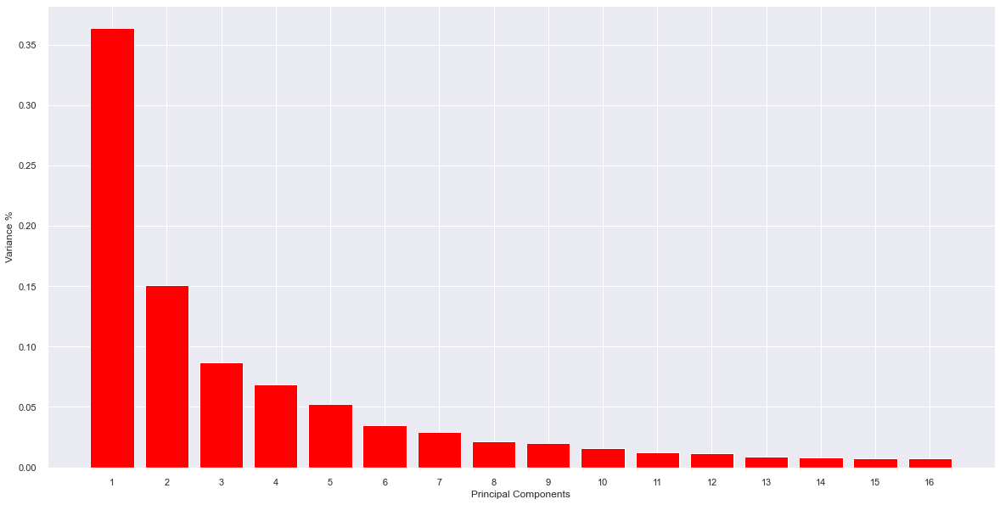

In [ ]:
# Plotting the variances for each PC
fig = plt.subplots(figsize=(20,10))
PC = range(1, pca2.n_components_+1)
plt.bar(PC, pca2.explained_variance_ratio_, color='red')
plt.xlabel('Principal Components')
plt.xticks(rotation=1)
plt.ylabel('Variance %')
plt.xticks(PC)

In [ ]:
pca2.explained_variance_ratio_

array([0.36418234, 0.15108346, 0.08711686, 0.06839452, 0.05266374,
       0.03459857, 0.0288712 , 0.02139853, 0.02040824, 0.01585285,
       0.01237798, 0.01178345, 0.00904957, 0.00835733, 0.00744806,
       0.0073438 ])

In [ ]:
pca2.explained_variance_ratio_.sum()

0.9009305052132254

**Yellow Brick PCA Visualisation**

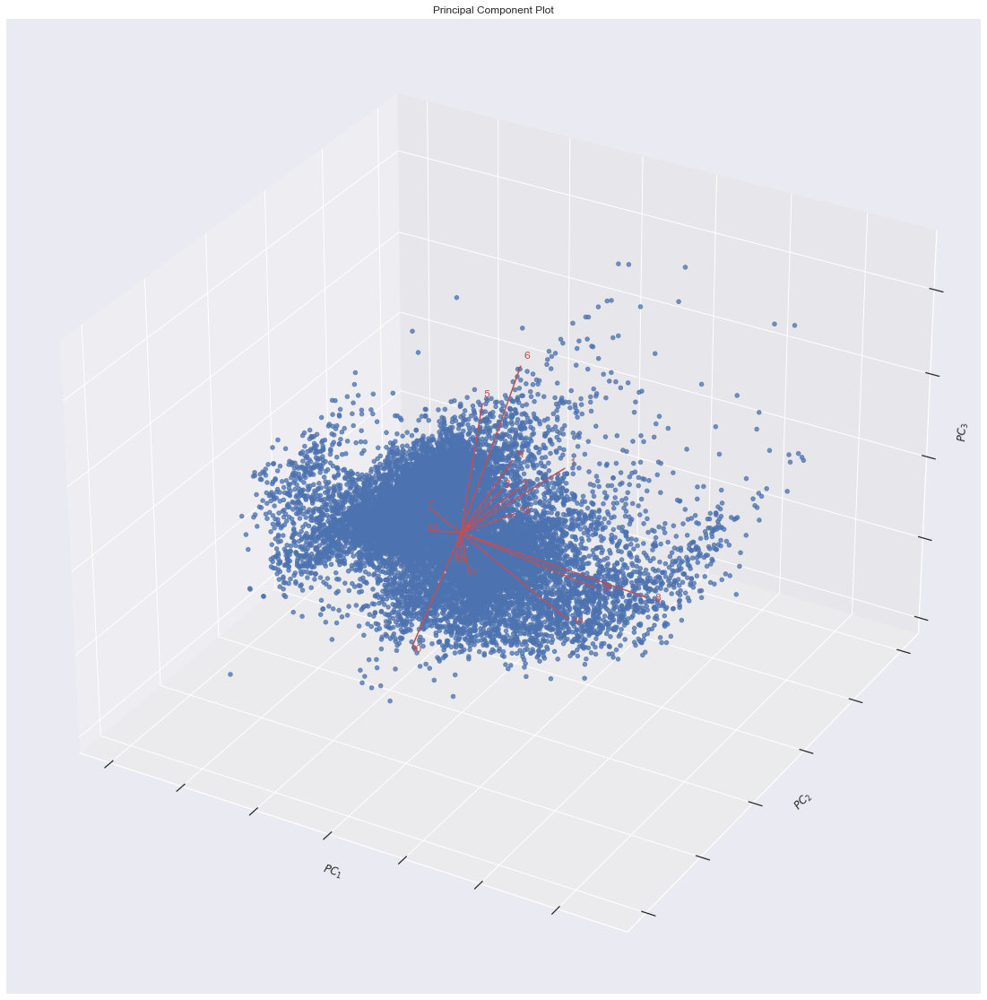

<Axes3DSubplot:title={'center':'Principal Component Plot'}, xlabel='$PC_1$', ylabel='$PC_2$'>

In [ ]:
from yellowbrick.features import PCA as pc
fig = plt.figure(figsize=(20,20))
visualiser = pc(proj_features=True,projection=3,fig=fig)
visualiser.fit_transform(x_pca)
visualiser.show()

**End of Yellow Brick PCA Visualisation**

For n_clusters = 2 The average silhouette_score is : 0.2241720669344602
For n_clusters = 3 The average silhouette_score is : 0.19132930859823416
For n_clusters = 4 The average silhouette_score is : 0.19532371272829996


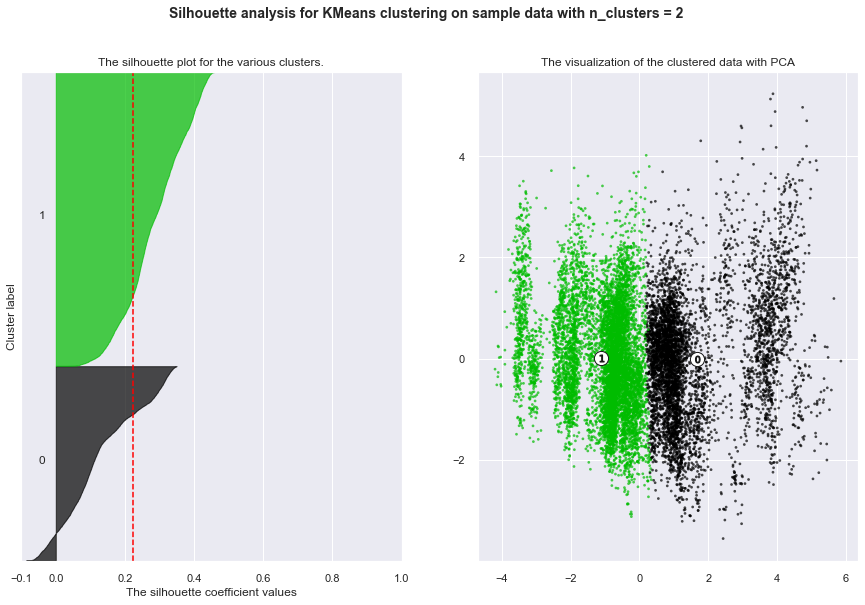

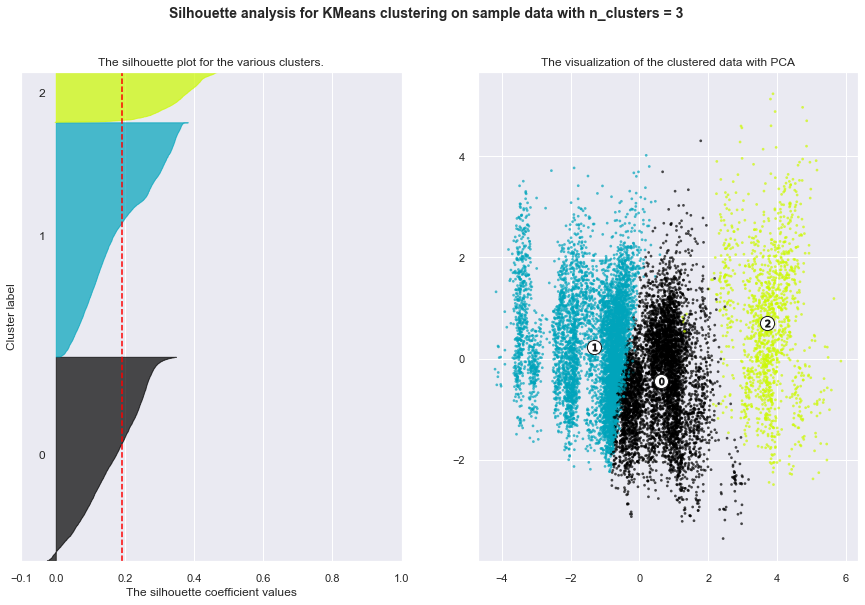

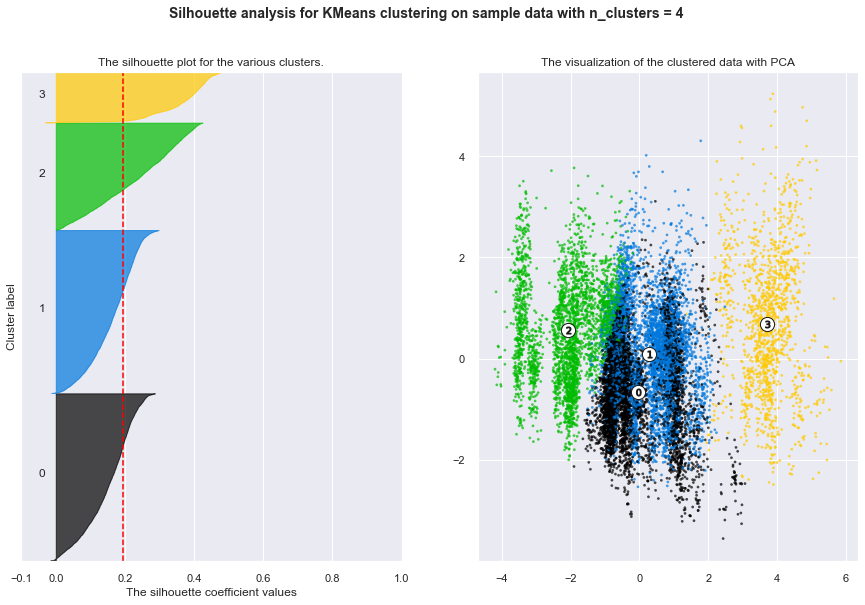

In [ ]:
import matplotlib.cm as cm
from sklearn.metrics import silhouette_samples, silhouette_score

range_n_clusters = [2,3,4]

for n_clusters in range_n_clusters:
    fig,ax = plt.subplots(1,2, figsize=(15,9))

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax[0].set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax[0].set_ylim([0, len(x_pca) + (n_clusters + 1) * 10])

    # Run Kmeans algorithm
    km = KMeans(n_clusters=n_clusters,random_state=42)
    cluster_labels = km.fit_predict(x_pca)
    # centriods = km.cluster_centers_

    # Get silhouette samples
    silhouette_avg = silhouette_score(x_pca, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    sample_silhouette_values = silhouette_samples(x_pca, cluster_labels)
    
    # Silhouette plot
    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to 
        # cluster i and sort them 
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i)/ n_clusters)
        ax[0].fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax[0].text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax[0].set_title("The silhouette plot for the various clusters.")
    ax[0].set_xlabel("The silhouette coefficient values")
    ax[0].set_ylabel("Cluster label")

    ax[0].axvline(x=silhouette_avg, color='red', linestyle='--')
    ax[0].set_yticks([]) # Clear the yaxis labels / ticks
    ax[0].set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd plot showing the actual clusters formed 
    colors = cm.nipy_spectral(cluster_labels.astype(float)/ n_clusters)
    ax[1].scatter(
        x_pca[:,0], x_pca[:,1], marker=".", s=30, lw=0, alpha=0.7,
        c=colors, edgecolor='k'
    )

    # Labeling the clusters
    centers  = km.cluster_centers_
    # Draw white circles at the cluster centers 
    ax[1].scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax[1].scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax[1].set_title("The visualization of the clustered data with PCA")
    # ax[1].set_xlabel("Feature space for the 1st feature")
    # ax[1].set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

**Range of SC (Sihouette score) Interpretation**
|score| explanation|
|-----|-----|
|0.71-1.0	| A strong structure has been found|
|0.51-0.70	| A reasonable structure has been found|
|0.26-0.50	| The structure is weak and could be artificial|
|< 0.25	| No substantial structure has been found|

In [ ]:
range_n_clusters = list(range(2,11))
for k in range_n_clusters:

    # Run Kmeans algorithm
    km = KMeans(n_clusters=k,random_state=42)
    labels = km.fit_predict(x_pca)
    centriods = km.cluster_centers_

    # Get the average silhouette score and plot it
    avg_score = silhouette_score(x_pca,labels)

    print(f"Silhouette score when K = {k} is: {avg_score}")

Silhouette score when K = 2 is: 0.2241720669344602
Silhouette score when K = 3 is: 0.19132930859823416
Silhouette score when K = 4 is: 0.19532371272829996
Silhouette score when K = 5 is: 0.18838771127155637
Silhouette score when K = 6 is: 0.17987836229831364
Silhouette score when K = 7 is: 0.18662500753936676
Silhouette score when K = 8 is: 0.17771895501229934
Silhouette score when K = 9 is: 0.17805686943508683
Silhouette score when K = 10 is: 0.1683525736795098


Text(0, 0.5, 'Sum of Squared Distance')

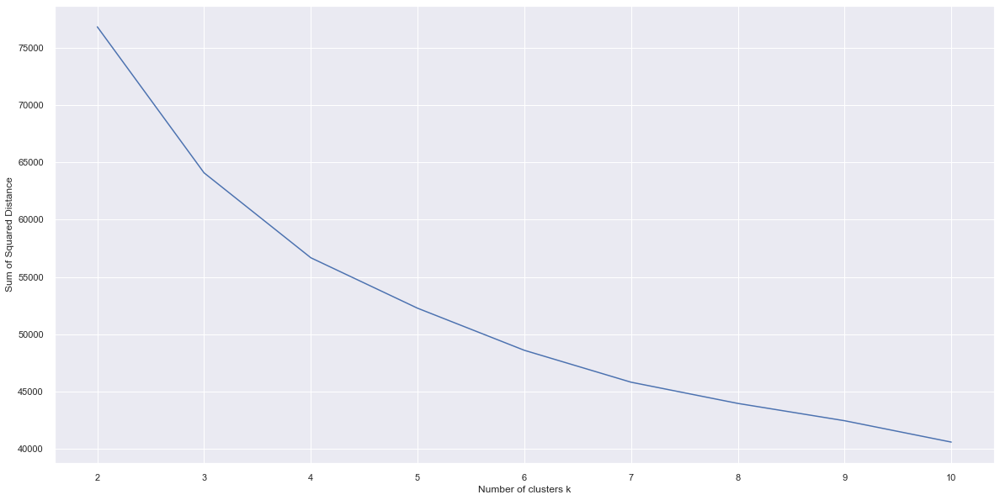

In [ ]:
sum_of_squared_distance = []

k_list = list(range(2,11))

for k in k_list:
    km =KMeans(n_clusters=k,random_state=42)
    km.fit(x_pca)
    sum_of_squared_distance.append(km.inertia_)

sns.set_theme(style="darkgrid")
# Plot sum_of_squared_distance against k 
fig, ax = plt.subplots(figsize=(20,10))
plt.plot(k_list,sum_of_squared_distance,'bx-') #bx-
plt.xlabel("Number of clusters k")
plt.ylabel("Sum of Squared Distance")
# plt.grid()

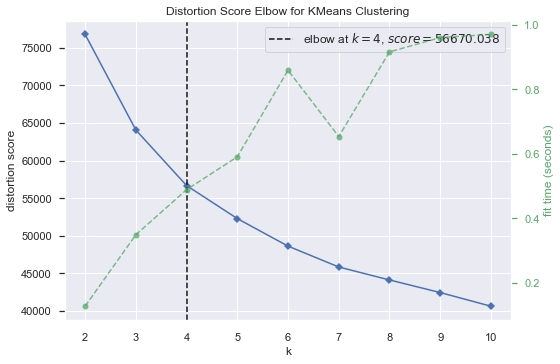

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
# https://www.scikit-yb.org/en/latest/quickstart.html#installation
# Using Yellowbrick for easy identification of the Elbow from Kmeans 
km =KMeans(random_state=30)
visualiser = KElbowVisualizer(km,k=(2,11))
visualiser.fit(x_pca)
visualiser.show() # k =4

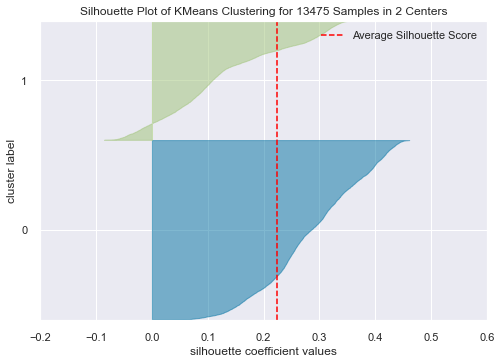

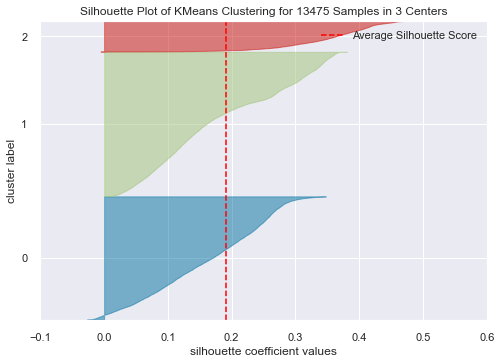

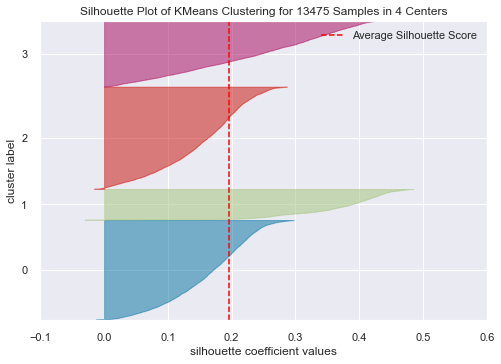

In [ ]:
# Using Yellowbrick for visualisation.
k_list = list(range(2,5))
for index,k in enumerate(k_list):
    km =KMeans(n_clusters=k,random_state=30)
    visualiser = SilhouetteVisualizer(km,colors='yellowbrick')
    visualiser.fit(x_pca)
    visualiser.show() # k =4

**Visualisation of 4 clusters based on Silhouette and Distortion score**

In [ ]:
km =KMeans(n_clusters=4,random_state=42)
km.fit(x_pca)
km.labels_
km.cluster_centers_

array([[-5.57098478e-02, -6.60189531e-01, -6.79590199e-01,
        -7.05086755e-02, -1.68029941e-01,  1.66425491e-01,
        -1.44385206e-02, -9.43296063e-02, -3.25839715e-02,
         1.22316845e-02, -6.19876245e-02, -4.01734680e-02,
        -9.75446809e-03, -1.07365223e-03, -4.62866526e-03,
         2.76918778e-02],
       [ 2.77556942e-01,  9.70602042e-02,  9.02621727e-01,
        -4.24378469e-01, -8.09861635e-02, -1.62634184e-01,
        -1.04656451e-02,  6.51993950e-02, -6.86856484e-03,
         2.82078032e-02,  4.62293166e-02,  6.03000075e-02,
        -1.95708775e-02,  2.04436952e-02, -1.59243900e-02,
         1.10209988e-02],
       [-2.07521539e+00,  5.60330003e-01, -2.67457180e-01,
         3.00166100e-01,  1.52867462e-01,  2.46349919e-02,
         1.23540732e-02,  2.97965097e-02,  3.44507753e-02,
        -6.43642637e-02,  4.17162023e-02, -6.74069404e-03,
         5.84530678e-02, -2.50084956e-02,  1.94350210e-02,
        -4.75720669e-02],
       [ 3.70443242e+00,  6.83572138e

In [ ]:
from collections import Counter
Counter(km.labels_)

Counter({2: 2959, 0: 4620, 1: 4504, 3: 1392})

In [ ]:
labels =km.predict(x_pca)

In [ ]:
from collections import Counter
Counter(labels)

Counter({2: 2959, 0: 4620, 1: 4504, 3: 1392})

Text(0, 0.5, 'Other components')

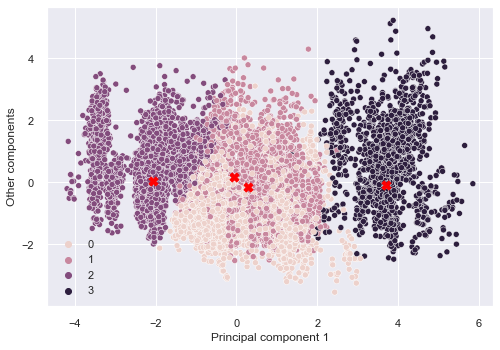

In [ ]:
sns.scatterplot(x=x_pca[:,0],y=x_pca[:,1],hue=km.labels_)
plt.scatter(km.cluster_centers_[:,0],km.cluster_centers_[:,5]
,marker='X',s= 80, label="centriods",color='red')
plt.xlabel("Principal component 1")
plt.ylabel("Other components")

In [ ]:
fig = px.scatter_3d(x_pca,x=x_pca[:,0],
                    y=x_pca[:,1],z=x_pca[:,2],
                    opacity=1,
                    size_max=18,
                    symbol=km.labels_,
                    color=km.labels_) # color=km.labels_, symbol=km.labels_

fig.update_layout(scene = dict(
                    xaxis_title='PCA 1',
                    yaxis_title='PCA 2',
                    zaxis_title='Others'),
                    width=700,
                    margin=dict(r=20, b=10, l=10, t=10)
                    )

# Hide colorbar axis
fig.update_layout(coloraxis_showscale=False)
# fig.update_traces(marker={'colorbar_xpad':0,
#                         'showscale':False})

fig.show()

**End of 4-cluster visualisation.**

**Using Davies evaluation technique**

In [ ]:
from sklearn.metrics import davies_bouldin_score

db = {}
for k in range(2, 10):
    # seed of 10 for reproducibility.
    kmeans = KMeans(n_clusters=k, max_iter=1000,random_state=10).fit(x_pca)
    if k == 3: labels = kmeans.labels_
    clusters = kmeans.labels_
    db[k] = davies_bouldin_score(x_pca,clusters)

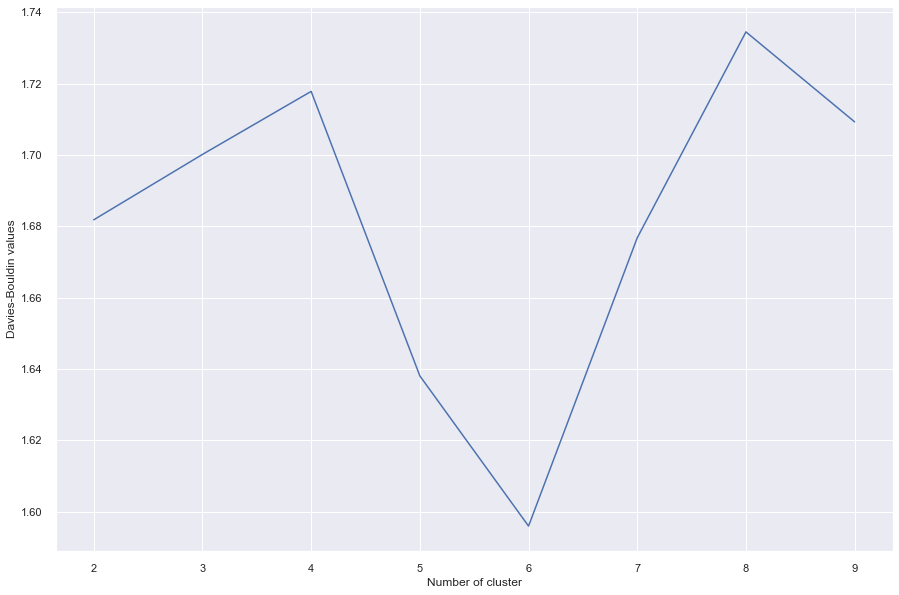

In [ ]:
plt.figure(figsize=(15,10))
plt.plot(list(db.keys()), list(db.values()))
plt.xlabel("Number of cluster")
plt.ylabel("Davies-Bouldin values")
plt.show()

- A lower Davies-Bouldin index relates to a model with better separation between the clusters.
- Hence the best number of clusters based on the evaluation technique is 6 clusters

**End of using Davies evaluation technique**

**Visualisation of Davies evaluation technique**

In [ ]:
km =KMeans(n_clusters=6,random_state=42)
km.fit(x_pca)
km.labels_

array([0, 3, 5, ..., 3, 4, 2])

In [ ]:
km.cluster_centers_

array([[-2.55553397e+00,  2.62454010e-01,  9.22997940e-03,
         4.56213336e-01,  2.91035092e-01,  1.13862042e-01,
        -1.29162925e-02,  2.24871322e-02,  1.25968273e-01,
        -1.01151411e-01,  5.77581483e-02,  7.62766482e-02,
         5.30430136e-02, -1.61487960e-02,  1.84371297e-02,
        -7.65072557e-02],
       [ 3.70957133e+00,  7.02442270e-01, -9.51028191e-02,
         9.78082416e-01,  4.98606203e-01, -8.01380852e-02,
         5.82579725e-02,  4.29508203e-02,  5.95000921e-02,
         5.94899471e-03, -3.85038263e-02, -4.68711471e-02,
        -2.79986515e-02, -9.34987318e-03,  2.52993138e-02,
        -2.56310090e-02],
       [ 1.24810736e+00, -7.49574855e-01, -7.46490522e-01,
        -6.28778690e-01, -3.86251201e-01,  2.12005529e-01,
        -1.76498729e-01,  2.66852254e-02,  2.25142948e-02,
        -2.66068820e-02, -1.14945480e-02,  1.49736384e-02,
        -8.89421371e-03,  3.34220926e-02, -3.06135711e-02,
         1.36759301e-02],
       [-5.83822736e-01, -8.73072718e

In [ ]:
from collections import Counter
Counter(km.labels_)

Counter({0: 1874, 3: 2918, 5: 1939, 4: 3742, 1: 1382, 2: 1620})

In [ ]:
labels =km.predict(x_pca)

In [ ]:
from collections import Counter
Counter(labels)

Counter({0: 1874, 3: 2918, 5: 1939, 4: 3742, 1: 1382, 2: 1620})

Text(0, 0.5, 'Other components')

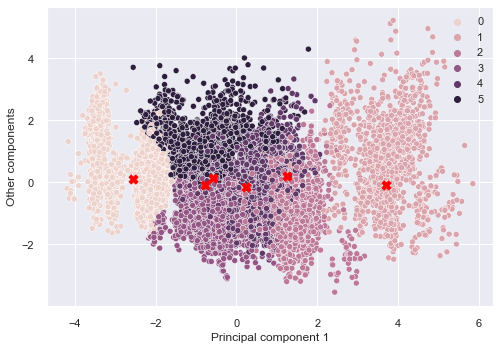

In [ ]:
sns.scatterplot(x=x_pca[:,0],y=x_pca[:,1],hue=km.labels_)
plt.scatter(km.cluster_centers_[:,0],km.cluster_centers_[:,5]
,marker='X',s= 80, label="centriods",color='red')
plt.xlabel("Principal component 1")
plt.ylabel("Other components")

In [ ]:
fig = px.scatter_3d(x_pca,x=x_pca[:,0],
                    y=x_pca[:,1],z=x_pca[:,2],
                    opacity=1,
                    size_max=18,
                    symbol=km.labels_,
                    color=km.labels_) # color=km.labels_, symbol=km.labels_

fig.update_layout(scene = dict(
                    xaxis_title='PCA 1',
                    yaxis_title='PCA 2',
                    zaxis_title='Others'),
                    width=700,
                    margin=dict(r=20, b=10, l=10, t=10)
                    )

# Hide colorbar axis
fig.update_layout(coloraxis_showscale=False)
# fig.update_traces(marker={'colorbar_xpad':0,
#                         'showscale':False})

fig.show()

**End of visalisation of Davies evaluation technique**

In [ ]:
# scaler1 = StandardScaler()
# scaler2 = MinMaxScaler()
# scaler3 = RobustScaler()
# dummies1_scaled = scaler3.fit_transform(dummies_1)
# pca = PCA().fit(dummies1_scaled)
# pca_data = pca.transform(dummies1_scaled)
# #plotting the cumulative summation of the explained variance
# fig, ax = plt.subplots(figsize=(15,9)) # W,L
# plt.plot(np.cumsum(pca.explained_variance_ratio_))
# plt.xlabel('Number of components')
# plt.ylabel('Variance for each components')
# plt.plot()
# plt.grid()
# plt.title("Robust Scaler")
# # Make use of Robust scaler instead

**Use of Agglomerative Clustering**

In [ ]:
range_n_clusters = list(range(2,11))
for k in range_n_clusters:

    # Run Kmeans algorithm
    ac = AgglomerativeClustering(n_clusters=k)
    labels = ac.fit_predict(x_pca)
    # centriods = ac.cluster_centers_

    # Get the average silhouette score and plot it
    avg_score = silhouette_score(x_pca,labels)

    print(f"Silhouette score at K {k} is: {avg_score}")

Silhouette score at K 2 is: 0.38242395490356446
Silhouette score at K 3 is: 0.20912059843366979
Silhouette score at K 4 is: 0.18407912922368103
Silhouette score at K 5 is: 0.17143782589502957
Silhouette score at K 6 is: 0.17452028705225772
Silhouette score at K 7 is: 0.15328933341557657
Silhouette score at K 8 is: 0.15941401567032176
Silhouette score at K 9 is: 0.16263955149360287
Silhouette score at K 10 is: 0.14873222275388817


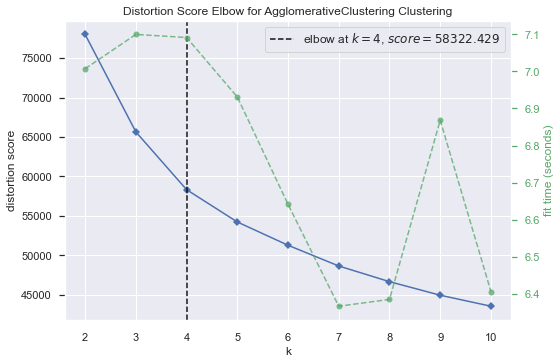

<AxesSubplot:title={'center':'Distortion Score Elbow for AgglomerativeClustering Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
ac= AgglomerativeClustering()
visualiser = KElbowVisualizer(ac,k=(2,11))
visualiser.fit(x_pca)
visualiser.show()

In [ ]:
db = {}
for k in range(2, 10):
    # seed of 10 for reproducibility.
    ac = AgglomerativeClustering(n_clusters=k)
    labels = ac.fit_predict(x_pca)
    # kmeans = KMeans(n_clusters=k, max_iter=1000,random_state=10).fit(x_pca)
    # if k == 3: labels = kmeans.labels_
    # clusters = kmeans.labels_
    db[k] = davies_bouldin_score(x_pca,labels)

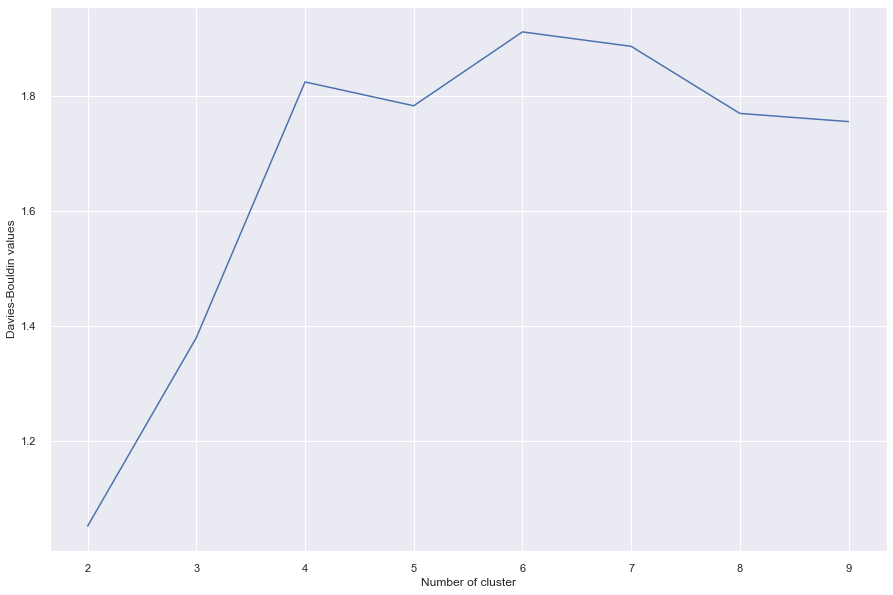

In [ ]:
plt.figure(figsize=(15,10))
plt.plot(list(db.keys()), list(db.values()))
plt.xlabel("Number of cluster")
plt.ylabel("Davies-Bouldin values")
plt.show()

In [ ]:
ac.labels_
ac.n_clusters_
ac.n_connected_components_
ac.n_features_in_

16

In [ ]:
# ax = plt.gca()
# bounds = ax.get_xbound()
# ax.plot(bounds, [7.25, 7.25], '--', c='k')
# ax.plot(bounds, [4, 4], '--', c='k')

# ax.text(bounds[1],7.25,'two clusters',va ='center',fontdict={'size':15})
# ax.text(bounds[1],4,'three clusters',va ='center',fontdict={'size':15})
# plt.xlabel("Sample index")
# plt.ylabel("Cluster distance")

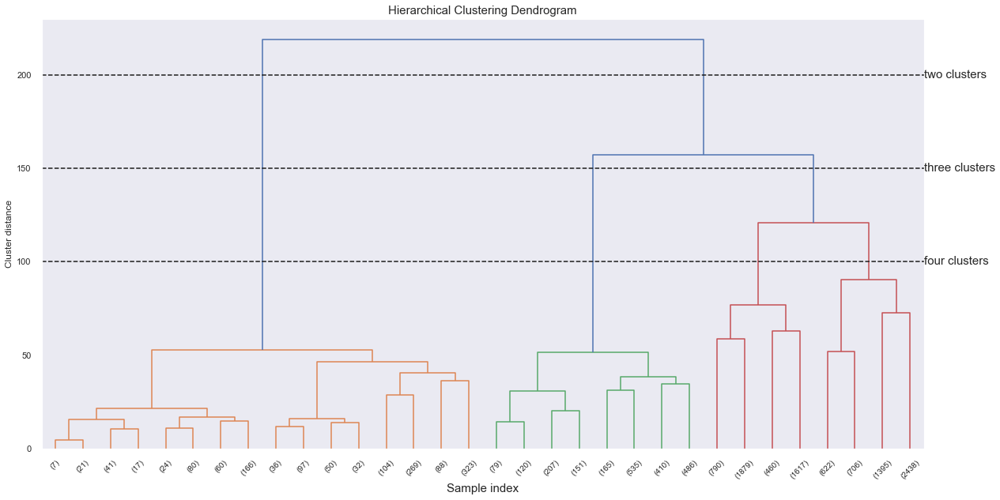

In [ ]:
def plot_dendrogram(model, **kwargs):
    counts = np.zeros(model.children_.shape[0])
    n_samples =len(model.labels_)
    for i,merge in enumerate(model.children_):
        current_count = 0 
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_,model.distances_,counts]
    ).astype(float)

    # plot corresponding dendrogram
    dendrogram(linkage_matrix,**kwargs)


sns.set_theme(style='dark')
fig,ax = plt.subplots(figsize=(20,10))
# Setting the algorithm
ac = AgglomerativeClustering(distance_threshold =0,n_clusters=None)
agg = ac.fit(x_pca)
plt.title("Hierarchical Clustering Dendrogram",fontdict={'size':15})
# plot the top 4 levels
plot_dendrogram(agg,truncate_mode='level',p=4)

ax = plt.gca()
bounds = ax.get_xbound()
ax.plot(bounds, [200, 200], '--', c='k')
ax.plot(bounds, [150, 150], '--', c='k')
ax.plot(bounds, [100, 100], '--', c='k')
ax.text(bounds[1],200,'two clusters',va ='center',fontdict={'size':15})
ax.text(bounds[1],150,'three clusters', va ='center',fontdict={'size':15})
ax.text(bounds[1],100,'four clusters', va ='center',fontdict={'size':15})
# plt.xlabel("Number of points in node(or index of point if no parenthesis ).")
plt.xlabel("Sample index",fontdict={'size':15})
# plt.xticks(rotation=45, ha="right",fontsize=10)
plt.xticks(fontsize=10)
plt.ylabel("Cluster distance")
plt.show()

**End of Agglomerative Clustering**

**Using DBSCAN**

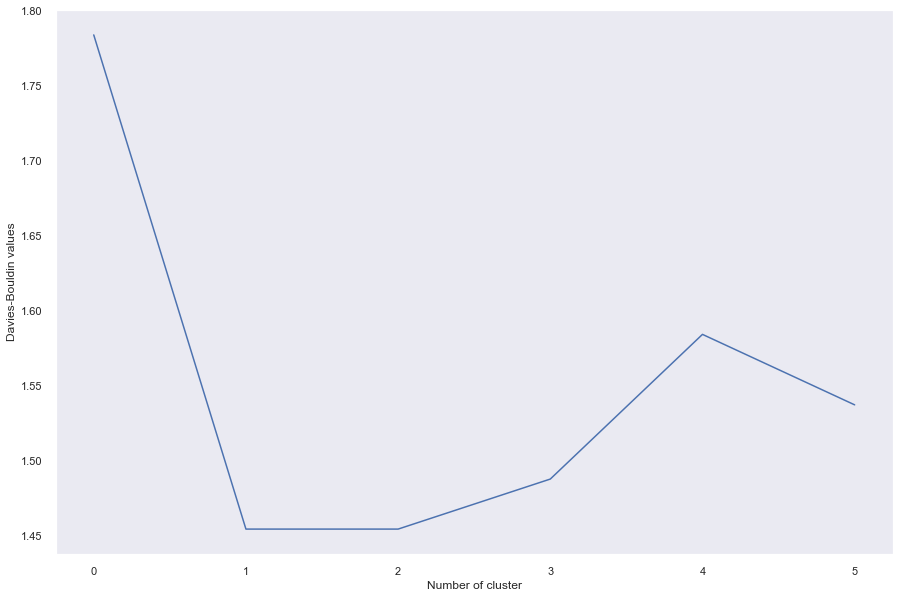

In [ ]:
# Using Davies Bouldin
db = {}

eps_list = [1,1.1,1.2,1.3,1.4,1.5,1.6,1.7,1.8,1.9,2]
samples = [5,10,15,20,25,30]
for i in range(len(eps_list)):
    for k in range(len(samples)):
        dbscan = DBSCAN(eps=eps_list[i],min_samples=samples[k])
        clusters = dbscan.fit_predict(x_pca)
        n_clusters_ = len(set(clusters)) - (1 if -1 in clusters else 0)
        n_noise_ = list(clusters).count(-1)
        db[k] = davies_bouldin_score(x_pca,clusters)



plt.figure(figsize=(15,10))
plt.plot(list(db.keys()), list(db.values()))
plt.xlabel("Number of cluster")
plt.ylabel("Davies-Bouldin values")
plt.show()

#  2-3 clusters are the bet for this 

In [ ]:
# Uncomment this to run the code below
# Using Silhouette
# eps_list = [1,1.1,1.2,1.3,1.4,1.5,1.6,1.7,1.8,1.9,2]
# samples = [5,10,15,20,25,30]
# for i in range(len(eps_list)):
#     for k in range(len(samples)):
#         dbscan = DBSCAN(eps=eps_list[i],min_samples=samples[k])
#         clusters = dbscan.fit_predict(x_pca)
#         n_clusters_ = len(set(clusters)) - (1 if -1 in clusters else 0)
#         n_noise_ = list(clusters).count(-1)
#         silhouette_scoring = silhouette_score(x_pca,clusters)
#         print(f"At eps:{eps_list[i]} and min_samples {samples[k]}")
#         print(f"Estimated number of clusters: {n_clusters_}" )
#         print(f"Estimated number of noise points:  {n_noise_}")
#         print(f"Silhouette score: {silhouette_scoring}\n")

**Optimum for this DBSCAN**
|eps|min_samples|estimated clusters|estimated noise points|silhouette score|
|----|----|----|----|----|
|1.7| 10|2|23|0.37|
|1.8| 25|2|30|0.37|

In [ ]:
dbscan = DBSCAN(eps=1.7,min_samples=25) 
# eps=2,min_samples=10
clusters = dbscan.fit_predict(x_pca)
print("Cluster memberships:\n{}".format(clusters))

# This stores the clusters labels 
listing = clusters.tolist()

Cluster memberships:
[0 0 0 ... 0 0 0]


In [ ]:
Counter(listing)

# Manual --> 11812

Counter({0: 12076, 1: 1376, -1: 23})

In [ ]:
n_clusters_ = len(set(clusters)) - (1 if -1 in clusters else 0)
n_noise_ = list(clusters).count(-1)
silhouette_scoring = silhouette_score(x_pca,clusters)

In [ ]:
print(f"Estimated number of clusters: {n_clusters_}" )
print(f"Estimated number of noise points: {n_noise_}")
print(f"Silhouette score: {silhouette_scoring}")

Estimated number of clusters: 2
Estimated number of noise points: 43
Silhouette score: 0.3687817179138286


In [ ]:
labels = dbscan.labels_
labels

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

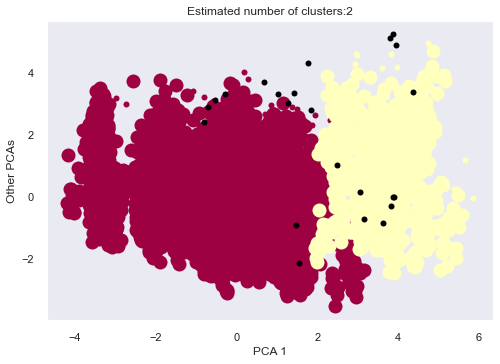

In [ ]:
core_samples_mask = np.zeros_like(dbscan.labels_,dtype=bool)
core_samples_mask[dbscan.core_sample_indices_] = True
labels = dbscan.labels_

unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0,1,len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        col = [0,0,0,1]

    class_member_mask = labels == k

    xy = x_pca[class_member_mask & core_samples_mask]
    plt.plot(
        xy[:,0],
        xy[:,1],
        'o',
        markerfacecolor=tuple(col),
        markeredgecolor='k',
        markersize=14

    )

    xy = x_pca[class_member_mask & ~core_samples_mask]
    plt.plot(
        xy[:, 0],
        xy[:, 1],
        "o",
        markerfacecolor=tuple(col),
        markeredgecolor="k",
        markersize=6,
    )

plt.title(f"Estimated number of clusters:{n_clusters_}")
plt.xlabel('PCA 1')
plt.ylabel('Other PCAs')
plt.show()

In [ ]:
dbscan.labels_

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [ ]:
km.labels_

array([0, 3, 5, ..., 3, 4, 2])

In [ ]:
# listing

In [ ]:
fig = px.scatter_3d(x_pca,x=x_pca[:,0],
                    y=x_pca[:,1],z=x_pca[:,2],
                    opacity=1,
                    size_max=18,
                    symbol=dbscan.labels_,
                    color=dbscan.labels_) # color=km.labels_, symbol=km.labels_

fig.update_layout(scene = dict(
                    xaxis_title='PCA 1',
                    yaxis_title='PCA 2',
                    zaxis_title='Others'),
                    width=700,
                    margin=dict(r=20, b=10, l=10, t=10)
                    )

# Hide colorbar axis
fig.update_layout(coloraxis_showscale=False)
# fig.update_traces(marker={'colorbar_xpad':0,
#                         'showscale':False})

fig.show()

In [ ]:
fig = px.scatter_3d(x_pca,x=x_pca[:,15],
                    y=x_pca[:,0],
                    z=x_pca[:,5],
                    opacity=1,
                    size_max=18,
                    symbol=km.labels_,
                    color=km.labels_) # color=km.labels_, symbol=km.labels_

fig.update_layout(scene = dict(
                    xaxis_title='PCA 1',
                    yaxis_title='PCA 2',
                    zaxis_title='Others'),
                    width=700,
                    margin=dict(r=20, b=10, l=10, t=10)
                    )

# Hide colorbar axis
fig.update_layout(coloraxis_showscale=False)
# fig.update_traces(marker={'colorbar_xpad':0,
#                         'showscale':False})

fig.show()

**End of DBSCAN Analysis**

### **Analysing the Results of PCA and Clustering (DBSCAN)**

In [ ]:
# Making copies
x_pca2 = x_pca.copy()
dummies_2 = dummies_1.copy()

In [ ]:
dummies_2

,seats,max_power_log,engine_log,mileage,km_driven,vehicle_age_log,avg_cost_price_log,selling_price_log,seller_type_Dealer,seller_type_Individual,...,brand_Kia,brand_MG,brand_Mahindra,brand_Maruti,brand_Nissan,brand_Renault,brand_Skoda,brand_Tata,brand_Toyota,brand_Volkswagen
0,5,3.856510,6.680855,19.700001,120000.0,2.302585,1.631596,0.788457,0,1,...,0,0,0,1,0,0,0,0,0,0
1,5,4.418841,7.088409,18.900000,20000.0,1.791759,2.115653,1.871802,0,1,...,0,0,0,0,0,0,0,0,0,0
2,5,4.394449,7.088409,17.000000,60000.0,2.484907,2.468950,1.147402,0,1,...,0,0,0,0,0,0,0,0,0,0
3,5,4.220977,6.906755,20.920000,37000.0,2.302585,1.631596,1.181727,0,1,...,0,0,0,1,0,0,0,0,0,0
4,5,4.601062,7.312553,22.770000,30000.0,1.945910,2.562253,1.902107,1,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19966,5,4.418841,7.088409,18.900000,9229.0,1.791759,2.088302,1.864080,1,0,...,0,0,0,0,0,0,0,0,0,0
19967,5,4.234831,6.991177,19.809999,10723.0,2.302585,2.096577,1.252763,1,0,...,0,0,0,0,0,0,0,0,0,0
19970,7,4.522875,7.225481,17.500000,18000.0,1.098612,2.438679,2.327278,1,0,...,0,0,0,1,0,0,0,0,0,0
19971,5,4.649378,7.312553,21.139999,67000.0,1.945910,2.586328,1.658228,1,0,...,0,0,0,0,0,0,1,0,0,0


In [ ]:
# x_pca2_frame = pd.DataFrame(x_pca2)
# x_pca2_frame

In [ ]:
df_dummies1_pca_dbscan = pd.concat([dummies_2.reset_index(drop = True), pd.DataFrame(x_pca2)], axis=1)
df_dummies1_pca_dbscan.columns.values[-16:] = ['component_1',
                                                'component_2',
                                                'component_3',
                                                'component_4',
                                                'component_5',
                                                'component_6',
                                                'component_7',
                                                'component_8',
                                                'component_9',
                                                'component_10',
                                                'component_11',
                                                'component_12',
                                                'component_13',
                                                'component_14',
                                                'component_15',
                                                'component_16',]

df_dummies1_pca_dbscan['segement_dbscan_pca'] = dbscan.labels_

In [ ]:
df_dummies1_pca_dbscan.head()

,seats,max_power_log,engine_log,mileage,km_driven,vehicle_age_log,avg_cost_price_log,selling_price_log,seller_type_Dealer,seller_type_Individual,...,component_8,component_9,component_10,component_11,component_12,component_13,component_14,component_15,component_16,segement_dbscan_pca
0,5,3.856510,6.680855,19.700001,120000.0,2.302585,1.631596,0.788457,0,1,...,-0.136873,0.165393,0.066916,0.076165,0.213986,-0.182715,0.273776,-0.267244,0.014404,0
1,5,4.418841,7.088409,18.900000,20000.0,1.791759,2.115653,1.871802,0,1,...,0.116784,-0.296851,-0.104527,-0.132905,-0.090716,-0.012830,0.061508,-0.271696,0.439789,0
2,5,4.394449,7.088409,17.000000,60000.0,2.484907,2.468950,1.147402,0,1,...,0.179718,-0.430131,-0.254076,-0.169924,0.241698,0.020508,0.005051,0.215132,-0.386736,0
3,5,4.220977,6.906755,20.920000,37000.0,2.302585,1.631596,1.181727,0,1,...,0.165893,-0.246382,-0.066914,0.108099,-0.036054,-0.024900,0.165374,-0.363470,0.246655,0
4,5,4.601062,7.312553,22.770000,30000.0,1.945910,2.562253,1.902107,1,0,...,0.024772,0.238707,0.465908,0.470597,0.055351,0.746701,0.611726,-0.067118,0.068956,0


In [ ]:
df_dummies1_pca_dbscan["segment"] = df_dummies1_pca_dbscan['segement_dbscan_pca'].map({0:'first',
                                                                                1:'second', 
                                                                                -1:'noise'})

**This is an example for dropping specific rows in a dataset**

In [ ]:
# df_dummies1_pca_dbscan_mycopy = df_dummies1_pca_dbscan.copy()
# i = df_dummies1_pca_dbscan_mycopy.loc[df_dummies1_pca_dbscan['segment'] == 'noise','segment'].index
# i

In [ ]:
# df_dummies1_pca_dbscan_mycopy.drop(i, inplace=True)

In [ ]:
# df_dummies1_pca_dbscan_mycopy.loc[df_dummies1_pca_dbscan['segment'] == 'noise','segment'].value_counts()

**End of example**

In [ ]:
# Selecting  components 1-16 and segment_dbscan_pca
df_dummies1_pca_dbscan[['component_1',
                                                'component_2',
                                                'component_3',
                                                'component_4',
                                                'component_5',
                                                'component_6',
                                                'component_7',
                                                'component_8',
                                                'component_9',
                                                'component_10',
                                                'component_11',
                                                'component_12',
                                                'component_13',
                                                'component_14',
                                                'component_15',
                                                'component_16',
                                                'segement_dbscan_pca']]

,component_1,component_2,component_3,component_4,component_5,component_6,component_7,component_8,component_9,component_10,component_11,component_12,component_13,component_14,component_15,component_16,segement_dbscan_pca
0,-3.237484,2.644357,-0.047497,0.817917,-0.385213,0.880056,0.404315,-0.136873,0.165393,0.066916,0.076165,0.213986,-0.182715,0.273776,-0.267244,0.014404,0
1,-0.759816,-0.625096,-0.715257,0.519650,-0.893215,-0.604054,0.411164,0.116784,-0.296851,-0.104527,-0.132905,-0.090716,-0.012830,0.061508,-0.271696,0.439789,0
2,-0.660184,1.269025,-1.208821,0.014425,-1.118805,-0.647545,0.270856,0.179718,-0.430131,-0.254076,-0.169924,0.241698,0.020508,0.005051,0.215132,-0.386736,0
3,-2.360968,0.891890,-0.415271,0.790202,-0.245530,-0.207399,-0.664866,0.165893,-0.246382,-0.066914,0.108099,-0.036054,-0.024900,0.165374,-0.363470,0.246655,0
4,0.627763,-0.450945,0.451347,-0.830497,0.354482,-0.870636,-0.387883,0.024772,0.238707,0.465908,0.470597,0.055351,0.746701,0.611726,-0.067118,0.068956,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13470,-0.801663,-0.892640,-1.005605,-0.202679,0.249380,-0.674705,0.598374,-0.003295,-0.268134,-0.037355,-0.114142,-0.217378,-0.039544,0.063685,-0.229385,0.431503,0
13471,-1.621617,0.241580,-1.252245,-0.341643,0.406842,-1.140531,0.272908,0.237508,-0.183878,-0.274099,-0.136633,-0.054581,0.137454,-0.086619,0.019349,0.220172,0
13472,0.717858,-1.504477,-0.409718,1.412303,1.340581,0.537982,0.178330,-0.561961,-0.454780,-0.478827,0.193872,-0.093752,0.185178,-0.022805,-0.078924,0.079935,0
13473,0.793662,0.313401,0.361264,-0.929830,0.164266,-0.341574,-0.128898,-0.045009,0.219283,0.271101,0.338635,-0.187414,-0.027873,-0.174053,0.093952,-0.130898,0


In [ ]:
# https://stackoverflow.com/questions/43136137/drop-a-specific-row-in-pandas
i = df_dummies1_pca_dbscan.loc[df_dummies1_pca_dbscan['segment'] == 'noise','segment'].index
i

Int64Index([  310,  1491,  1542,  1729,  1927,  2684,  3374,  3799,  3878,
             4428,  4652,  5702,  6372,  7226,  7674,  7702,  7950,  8835,
             9124,  9322, 10180, 11004, 12113],
           dtype='int64')

In [ ]:
df_dummies1_pca_dbscan.drop(i, inplace=True)

In [ ]:
# df.loc[df.unit == "Lakh", 'min_cost_price'] = df.min_cost_price * 100000.0

# The code above serves as a reference to the code below
df_dummies1_pca_dbscan.loc[df_dummies1_pca_dbscan['segment'] == 'noise','segment'].value_counts()

Series([], Name: segment, dtype: int64)

In [ ]:
df_dummies1_pca_dbscan.loc[df_dummies1_pca_dbscan['segment'] == 'first','segment'].value_counts()

first    12076
Name: segment, dtype: int64

In [ ]:
df_dummies1_pca_dbscan.loc[df_dummies1_pca_dbscan['segment'] == 'second','segment'].value_counts()

second    1376
Name: segment, dtype: int64

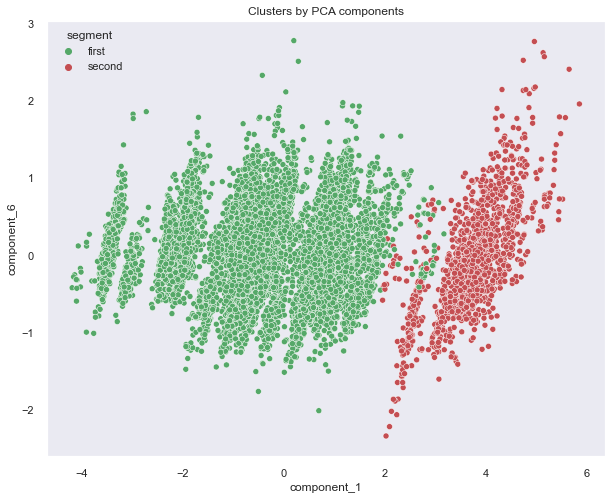

In [ ]:
# Change the components to see different visualisation of the pca clusters
x_axis = df_dummies1_pca_dbscan['component_1']
y_axis = df_dummies1_pca_dbscan['component_6']
fig,ax = plt.subplots(figsize=(10,8))
sns.scatterplot(x_axis,y_axis, data=df_dummies1_pca_dbscan, hue='segment',
palette=['g','r'])

plt.title("Clusters by PCA components")
plt.show()

**Supervised Learning Classification Algorithms upon the Clusters**
- Logistic Regression
- KNN
- Support Vector Machines
- Decision Tree
- Bagging and Pasting
- Random Forest and Extra Trees
- Boosting
- Stacking and Blending

In [ ]:
df_dummies1_pca_dbscan.segement_dbscan_pca.dtype

dtype('int64')

In [ ]:
df_knn_set = df_dummies1_pca_dbscan[['component_1',
                                                'component_2',
                                                'component_3',
                                                'component_4',
                                                'component_5',
                                                'component_6',
                                                'component_7',
                                                'component_8',
                                                'component_9',
                                                'component_10',
                                                'component_11',
                                                'component_12',
                                                'component_13',
                                                'component_14',
                                                'component_15',
                                                'component_16',
                                                'segement_dbscan_pca']]

In [ ]:
df_knn_set.isnull().sum()

component_1            0
component_2            0
component_3            0
component_4            0
component_5            0
component_6            0
component_7            0
component_8            0
component_9            0
component_10           0
component_11           0
component_12           0
component_13           0
component_14           0
component_15           0
component_16           0
segement_dbscan_pca    0
dtype: int64

In [ ]:
X = df_knn_set.drop(['segement_dbscan_pca'],axis=1)
y = df_knn_set['segement_dbscan_pca']

In [ ]:
# Making use of column transformer
from sklearn.compose import ColumnTransformer,make_column_selector
from sklearn.model_selection import GridSearchCV,train_test_split,KFold,StratifiedShuffleSplit
from sklearn.pipeline import  Pipeline
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X,y,random_state=42)
clf = KNeighborsClassifier()
params_grid = {'n_neighbors':[5,6,7],
                "weights":['uniform','distance'],
                "p":[1,2]}

my_cv = StratifiedShuffleSplit(n_splits=10,test_size=.2,train_size=.8)

# Try to specify the scoring for the grid
mygrid = GridSearchCV(clf,param_grid=params_grid,cv=my_cv,scoring='roc_auc')
mygrid.fit(X_train,y_train)

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=10, random_state=None, test_size=0.2,
            train_size=0.8),
             estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': [5, 6, 7], 'p': [1, 2],
                         'weights': ['uniform', 'distance']},
             scoring='roc_auc')

In [ ]:
print(f"Best params: {mygrid.best_params_}\n")
print(f"Best estimator: {mygrid.best_estimator_}\n")
print(f"Best validation score: {mygrid.best_score_}")

Best params: {'n_neighbors': 5, 'p': 1, 'weights': 'uniform'}

Best estimator: KNeighborsClassifier(p=1)

Best validation score: 1.0


Optimisation

In [ ]:
mygrid_trainset = mygrid.best_estimator_

In [ ]:
mygrid_trainset

KNeighborsClassifier(p=1)

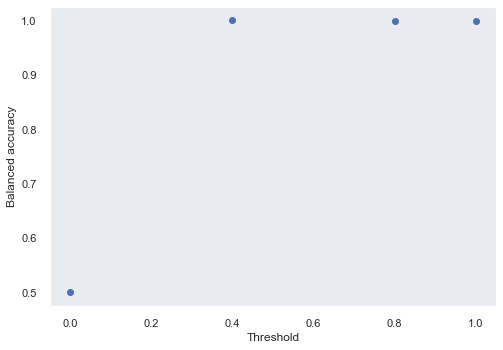

This is the optimal threshold: 0.4


In [ ]:
# Choosing the threshold
# https://www.yourdatateacher.com/2021/06/14/are-you-still-using-0-5-as-a-threshold/
# https://datascience.stackexchange.com/questions/89880/classification-threshold-tuning-with-gridsearchcv
from sklearn.metrics import balanced_accuracy_score
y_threshold_value = mygrid_trainset.predict_proba(X_train)[:,1]

# Optimizing the threshold is equivalent to optimize a 
# hyperparameter of your pipeline, so we do it only on the training dataset.
threshold = []
accuracy = []

for p in np.unique(y_threshold_value):
  threshold.append(p)
  y_pred_new = (y_threshold_value >= p).astype(int)
  accuracy.append(balanced_accuracy_score(y_train,y_pred_new))
  
plt.scatter(threshold,accuracy)
plt.xlabel("Threshold")
plt.ylabel("Balanced accuracy")
plt.show()
print(f"This is the optimal threshold: {threshold[np.argmax(accuracy)]}")

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      9071
           1       1.00      1.00      1.00      1018

    accuracy                           1.00     10089
   macro avg       1.00      1.00      1.00     10089
weighted avg       1.00      1.00      1.00     10089



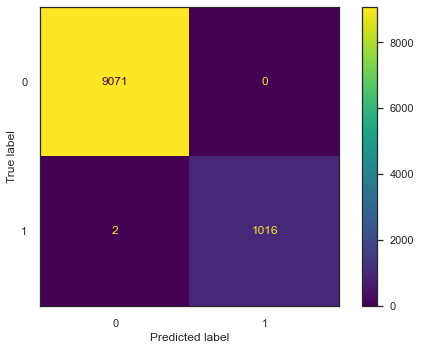

In [ ]:
# Classification report
from sklearn.metrics import classification_report,confusion_matrix,ConfusionMatrixDisplay
y_pred_train = mygrid_trainset.predict(X_train)
y_pred_train

# 1 is automatic, automatic is the target variable 

y_pred_lower_threshold = mygrid_trainset.predict_proba(X_train)[:,1] > 0.8
y_train = y_train
sns.set_theme(style='white')
def class_report(model,y_train,y_pred_train):
    print(classification_report(y_train,y_pred_train))
    cm = confusion_matrix(y_train,y_pred_train,labels=model.classes_)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
    disp.plot()
    plt.show()


class_report(mygrid_trainset,y_train,y_pred_lower_threshold)

Checking Uncertainties: 
[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 0]

Average Precision: 1.00


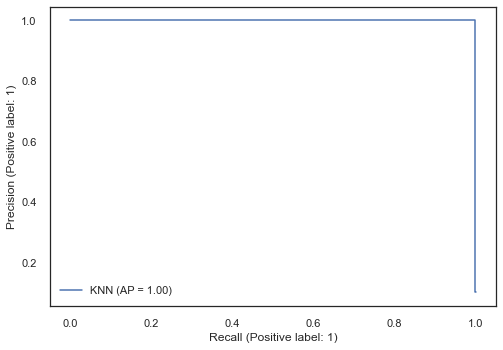

In [ ]:
from sklearn.metrics import average_precision_score,roc_auc_score, PrecisionRecallDisplay,plot_roc_curve,RocCurveDisplay

# Precision-recall
y_predict_proba_train = mygrid_trainset.predict_proba(X_train)[:,1] >= 0.8
print("Checking Uncertainties: \n{}\n".format((y_predict_proba_train[:100]).astype(int)))

average_precision = average_precision_score(y_train,y_predict_proba_train)
print("Average Precision: {:.2f}".format(average_precision))

disp = PrecisionRecallDisplay.from_predictions(y_train,y_predict_proba_train,name="KNN")

AUC score: 1.00


Text(0.5, 1.0, '2-class ROC curve for training:')

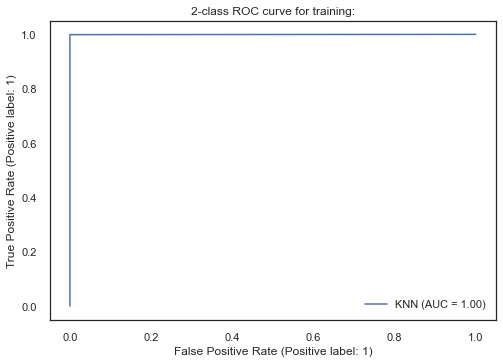

In [ ]:
roc_scoring = roc_auc_score(y_train,y_predict_proba_train)
print("AUC score: {:.2f}".format(roc_scoring))

disp = RocCurveDisplay.from_predictions(y_train,y_predict_proba_train,name='KNN')
plt.title("2-class ROC curve for training:")

Working on the test data 

In [ ]:
mygrid.classes_

array([0, 1], dtype=int64)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3005
           1       1.00      1.00      1.00       358

    accuracy                           1.00      3363
   macro avg       1.00      1.00      1.00      3363
weighted avg       1.00      1.00      1.00      3363



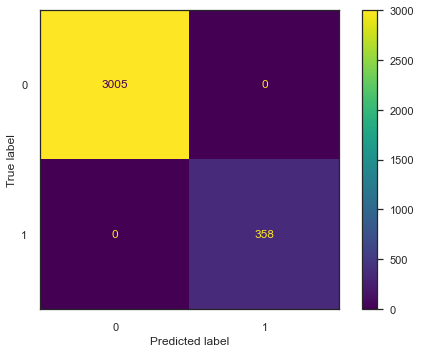

In [ ]:
# Classification report
from sklearn.metrics import classification_report,confusion_matrix,ConfusionMatrixDisplay
y_test = y_test
y_predict_proba_test = mygrid.predict_proba(X_test)[:,1] >= 0.8
sns.set_theme(style='white')
def class_report(model,y_test,pred):
    print(classification_report(y_test,pred))
    cm = confusion_matrix(y_test,pred,labels=model.classes_)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
    disp.plot()
    plt.show()


class_report(mygrid,y_test,y_predict_proba_test)

In [ ]:
tn,fp,fn,tp = confusion_matrix(y_test, y_predict_proba_test).ravel()
print("The tp,tn,fp,fn respectively: \n{} {} {} {}\n".format(tp,tn,fp,fn))

The tp,tn,fp,fn respectively: 
358 3005 0 0



In [ ]:
print("TNR (Specificity) is: \n{}\n".format({tn/(tn+fp)}))
print("TPR (Sensitivity) is: \n{}\n".format({tp/(tp+fn)}))
print("FPR is: \n{}\n".format({fp/(fp+tn)}))
print("FNR is: \n{}\n".format({fn/(tp+fn)}))
print("Precision is: \n{}".format({tp/(tp+fp)}))

TNR (Specificity) is: 
{1.0}

TPR (Sensitivity) is: 
{1.0}

FPR is: 
{0.0}

FNR is: 
{0.0}

Precision is: 
{1.0}


ROC-curve

In [ ]:
from sklearn.metrics import roc_curve,roc_auc_score, precision_recall_curve

# y_predict_proba = mygrid.predict_proba(X_test)[:,1]
y_predict_proba_test = mygrid_trainset.predict_proba(X_test)[:,1] >= 0.8
fpr,tpr, thresholds = roc_curve(y_test,y_predict_proba_test)
auc_score = roc_auc_score(y_test,y_predict_proba_test)

fig = px.area(
    x=fpr, y=tpr,
    title=f'ROC Curve (AUC= {auc_score:.2f})',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
    width=700, height=500
)

fig.add_shape(
    type ='line',line=dict(dash='dash'),
    x0=0,x1=1,y0=0,y1=1
)

fig.update_yaxes(scaleanchor='x', scaleratio=1)
fig.update_xaxes(constrain='domain')
fig.show()

Precision-Recall curve

In [ ]:
# y_predict_proba = mygrid.predict_proba(X_test)[:,1]
y_predict_proba_test = mygrid_trainset.predict_proba(X_test)[:,1] >= 0.8
precision, recall, thresholds = precision_recall_curve(y_test,y_predict_proba_test)
average_precision = average_precision_score(y_test,y_predict_proba_test)

fig = px.area(
    x=recall, y=precision,
    title=f'Precision-Recall Curve (AP= {average_precision:.2f})',
    labels=dict(x='Recall', y='Precision'),
    width=700, height=500
)



fig.update_yaxes(scaleanchor='x', scaleratio=1)
fig.update_xaxes(constrain='domain')
fig.show()

End of different

## Conclusion
- In this analysis, different methods of clustering & evaluation were used with on this dataset. 
- Furthermore, the DBSCAN clustering was fed into the dataset for prediction on using supervised learning.